# Proyecto 2 : Ingeniería de features, Modelos avanzados e Interpretación de modelos
### Creado por: Juan David Rincón
#### jdrincone@gmail.com
#### [**Portafolio de proyectos**](https://jdrincone.github.io/Portafolio/)

Este proyecto se enfocará en el análisis de datos de un dataset de la página web [Properati](www.properati.com.ar)., el cual presenta información sobre propiedades en venta en sectores cercanos a la capital Argentina, Buenos Aires. Se aplicará ingeniería de Features y Modelos Avanzados (Regularización Ridge, Lasso, Xgboots, RandomForest, optimización de hiperparámetros usando Cross Validation junto a GridSearchCV y RandomSearchCV) para desarrollar con mayor profundidad un modelo de Machine Learning.

<a id="s-0"></a>
## Contenido
*  [**Primera parte: EDA**](#s-1)
    - [Tratamiento nulos](#s-10)
    - [Features ](#s-11)
     - [Variables categóricas](#s-112)
     - [Variables númericas continuas](#s-113)
     - [Criterio de los 3$\sigma$](#s-113a)
     - [**Transformación variables continuas**](#s-113b)
     - [Correlación](#s-12)
     - [Variables númericas discretas](#s-13) 
      -[Predición batrooms faltantes](s-131) 
     
  [**Segunda parte: Modelos simples mejorados**](#s-2)
     - [Benchmark](#s-21)
       - [Aciertos y Desaciertos](#s-3raciertos)  
       - [Importancia predictores](#s-21a)
     - [DecisionTree](#s-22)
        - [Optimización de hiperparámetros](#s-221)
          -  [Aciertos y Desaciertos](#s-3raciertos2)      
          -  [Importancia predictores](#s-221a)
     -[KNeighbors  ](#s-23)
       - [Aciertos y Desaciertos](#s-3raciertos3)
       - [Optimización de hiperparámetros](#s-231)
           
  [**Tercera parte: Modelos Avanzados**](#s-3)
    - [Regresión lineal con regularización](#s-31)
      - [Ridge]((#s-311)
       - [Optimización de hiperparámetros](#s-311a)
        - [Aciertos y Desaciertos](#s-3raciertos3)   
        - [Importancia predictores](#s-311b)
      - [Lasso](#s-312)
       - [Optimización de hiperparámetros](#s-312a)
       - [Aciertos y Desaciertos](#s-3raciertos4)
       - [Importancia predictores](#s-312b)
   - [xgboots](#s-32)
      - [Optimización de hiperparámetros](#s-321)
      - [Aciertos y Desaciertos](#s-3raciertos5)
      - [Importancia de predictores](#s322)
    - [RandomForest](#s-33)
      - [Aciertos y Desaciertos](#s-3raciertos6)
      - [Optimización de hiperparámetros](#s-331)
      - [Importancia predictores](#s-332)
      
  [**Comparación modelos**](#s-4) 
  
  [**Conclusiones**](#s-5)
  
  [**Extra**](#s-6)
    - [Detección de outliers de forma gráfica](#s-61)

<a id="s-1"></a>
# Primera parte: EDA
Se inicia importando las librerias necesarias para explorar los datos y el conjunto de datos a explorar.

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from matplotlib import gridspec
import seaborn as sns
plt.style.use("ggplot")
from matplotlib import rc
rc('text', usetex=True)
rc('font', family='serif')
# formato retina mejora la calidad de las imagenes
%config InlineBackend.figure_format = 'retina'
import missingno as msno
from time import time #importamos la función time para capturar tiempos
import warnings
warnings.filterwarnings('ignore')

In [2]:
d = pd.read_csv('DS_Proyecto_01_Datos_Properati.csv')

In [3]:
d = d.drop_duplicates() #eliminar terminos duplicados

In [4]:
d.shape

(144302, 19)

<a id="s-10"></a>
# Tratamientos valores nulos
### Visualización y correlación entre valores faltantes en el dataset
A continuación generamos una *'radiografía'* del dataset. Dicha imagen nos muestra la distribución de valores faltantes (segmentos horizontales blancos) en cada columna (eje horizontal) y la posición (eje vertical).

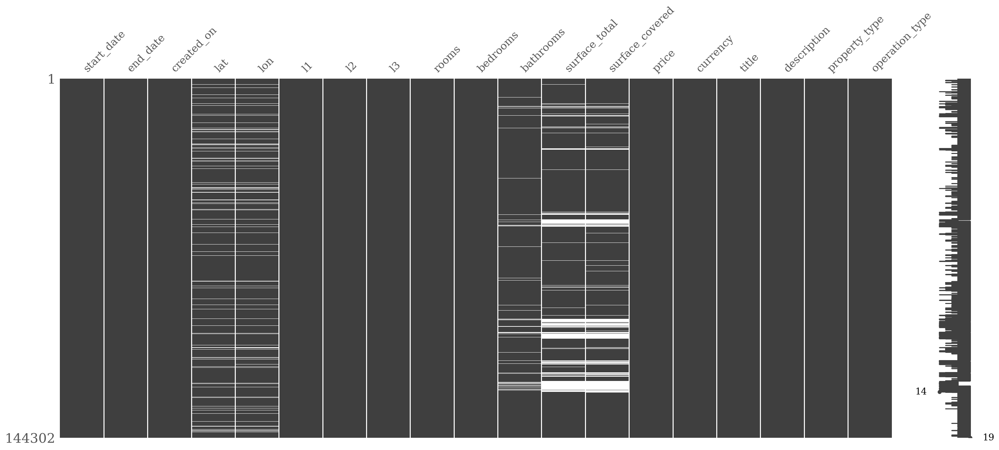

In [5]:
rc('text', usetex=False) #bloquemos por el momento latex, pues la librerio msno aun no es compatible con latex
msno.matrix(d);

Observe que los valores nulos aparecen principalmente en las columnas lat, lon, bathrooms, surface_total, surface_covered. La posición realmente no nos intereza, pues bajo permutaciones de indices del dataset, se cambio el la radiografía. La anterior información de valores faltantes la obtenemos también de la siguiente forma:

In [6]:
k = d.isna().sum()
k[k!=0]

lat                 9572
lon                 9606
bathrooms           5924
surface_total      20261
surface_covered    21339
dtype: int64

Con la anterior información, principalmente con la radiografía, surge la pregunta ¿Hay alguna correlacción entre los valores faltantes por columnas?
Dicha pregunta la respondemos de forma segura con la siguiente gráfica de correlación.

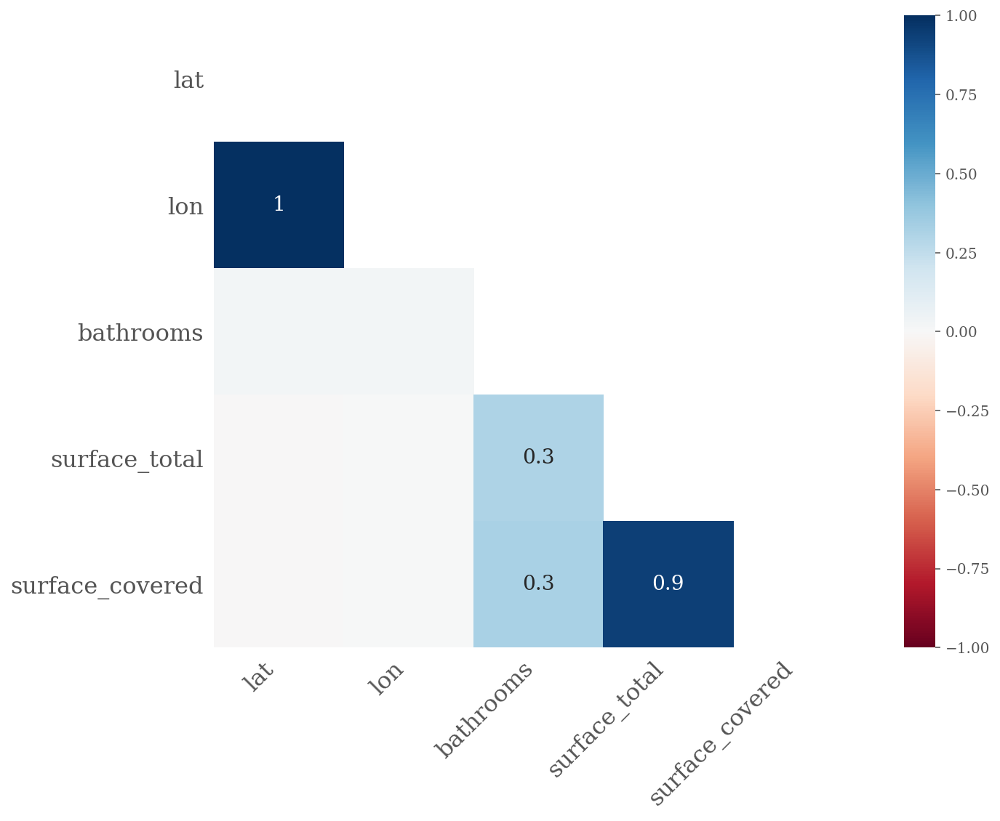

In [7]:
msno.heatmap(d, figsize=(10,8));

Esta tabla nos indica (y como el lector debio de darse cuenta con la radiografía) que las columnas o features lat y lon estan altamente correlacionadas, de igual forma superficie total y cubierta. Los valores faltantes de los demás features poseen baja o nula correlación.

Con esto, ya poseemos información relevante para el posterior tratamiento que realicemos los features que escojamos para realizar la predición del precio de un inmueble.

A continuación procedemos a la elección y limpieza de las variables que nos permitirán ejecutar nuestra tarea.

## Variables categoricas

In [8]:
d.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 144302 entries, 0 to 146659
Data columns (total 19 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   start_date       144302 non-null  object 
 1   end_date         144302 non-null  object 
 2   created_on       144302 non-null  object 
 3   lat              134730 non-null  float64
 4   lon              134696 non-null  float64
 5   l1               144302 non-null  object 
 6   l2               144302 non-null  object 
 7   l3               144302 non-null  object 
 8   rooms            144302 non-null  float64
 9   bedrooms         144302 non-null  float64
 10  bathrooms        138378 non-null  float64
 11  surface_total    124041 non-null  float64
 12  surface_covered  122963 non-null  float64
 13  price            144302 non-null  float64
 14  currency         144302 non-null  object 
 15  title            144302 non-null  object 
 16  description      144302 non-null  obje

Entre los features categoricos solo analizaremos: **property_type, l2  y l3**, las demás fueron exploradas en el proyecto 1 [ver aquí](https://jdrincone.github.io/Portafolio/post/proyect-2/).

### Tipos de propiedad 

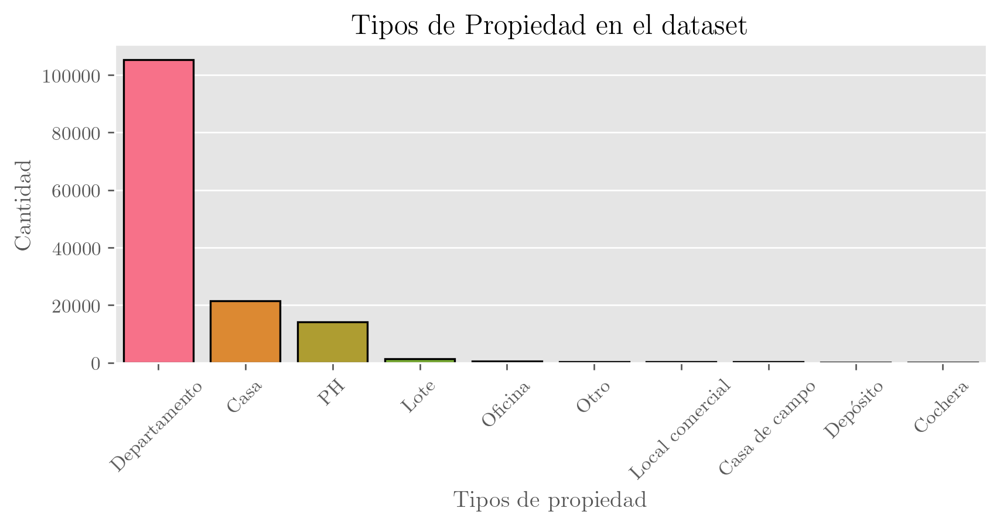

In [9]:
rc('text', usetex=True) #bloquemos por el momento latex, pues la librerio msno aun no es compatible con latex
plt.figure(dpi=120,figsize=(8,3))
ax = sns.countplot(data = d, x = 'property_type',
                   order = d['property_type'].value_counts().index,saturation=1,linewidth=1,edgecolor=(0,0,0),palette="husl");
ax.set_title("Tipos de Propiedad en el dataset")
ax.set_ylabel("Cantidad")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45)
ax.set_xlabel("Tipos de propiedad");

La gráfica nos indica que las propiedades son principalmente: Departamentos, Casas y PH. Las propiedades representan menos del 1% de lo que representa la propiedad principal, por tanto pueden despreciarse para análisis posteriores.

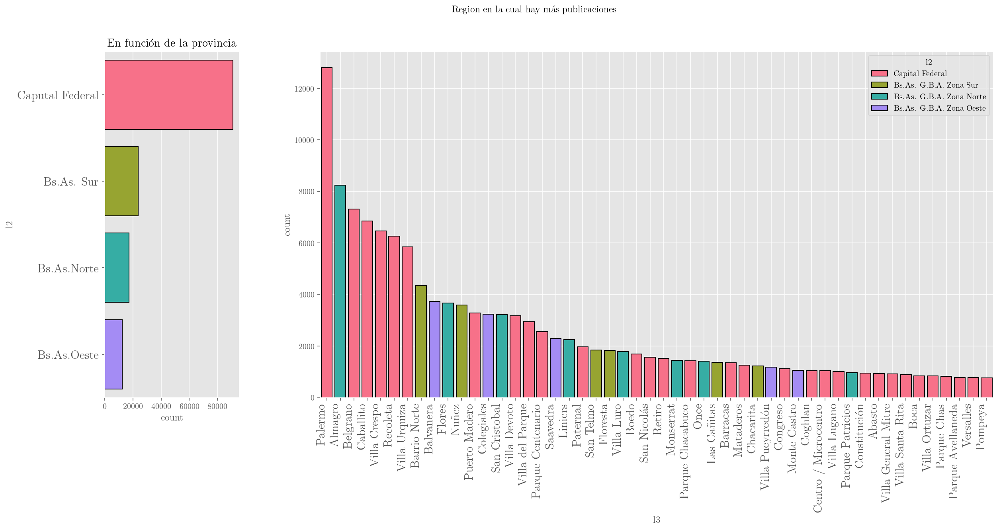

In [10]:
n=5
df_capital = d[d.l2=='Capital Federal']

fig = plt.figure(figsize=(20,8))
spec = gridspec.GridSpec(ncols=2, nrows=1, width_ratios=[1, 5])
ax0 = fig.add_subplot(spec[0])
fig.suptitle('Region en la cual hay más publicaciones');
sns.countplot(data = d, y = 'l2',dodge=False,order = d['l2'].value_counts().index,palette="husl",saturation=1,linewidth=1,edgecolor=(0,0,0),ax=ax0);
ax0.set_title('En función de la provincia')
ax0.set_yticklabels(['Caputal Federal','Bs.As. Sur','Bs.As.Norte','Bs.As.Oeste'], ha='right',fontsize=15 )
ax1 = fig.add_subplot(spec[1])
sns.countplot(data = d, x = 'l3',hue ='l2', dodge=False,order = d['l3'].value_counts()[:50].index,palette="husl",saturation=1,linewidth=1,edgecolor=(0,0,0),ax =ax1);
xlabels = pd.Series(df_capital['l3'].value_counts()[:50]).index
ax1.set_xticklabels(xlabels, rotation=90, ha='right',fontsize=15)
plt.grid(True)
plt.show()

El anterior gráfico se resume el número de publicaciones de ventas para cada provincia y el número de publicaciones de forma decreciente para barrios de cada provincia. Como encontramos antes, los primeros barrios donde hay más publicaciones en ventas pertenecen a Capital Federal. Por tanto solo analizaremos el top tres de tipos de propiedad vendidas en Capital Federal.


Con esta información construimos subconjunto de datos de trabajo.

In [11]:
df = d[((d["property_type"]=='Departamento') | (d["property_type"]=='Casa') |
                     (d["property_type"]=='PH')) & (d["l2"]=='Capital Federal')]
print(f'Verificamos tamaño del dataset con el filtro descrito: {df.shape[0]} instancias, {df.shape[1]} columnas ')

Verificamos tamaño del dataset con el filtro descrito: 89874 instancias, 19 columnas 


### Features para posterios trabajo

In [12]:
df = df[['l3','rooms','bedrooms','bathrooms','surface_total','surface_covered','property_type','price']]

In [13]:
#filtro de consistencia en entre los features superficie total y cubierta
#filtro superficie cubierta <= superficie total 
df = df[df['surface_covered'] <= df['surface_total']]
#  de 10m^2 , por tanto aplicaremos este filtro
df = df[df['surface_covered']>=10]

<a id="s-113"></a>
# Variables númericas continuas
Iniciamos observando como se distribuyen los valores de las variables númericas continuas, en este caso con un diagrama de caja, que nos permite visualizar más facil los valores atípicos presentes. 

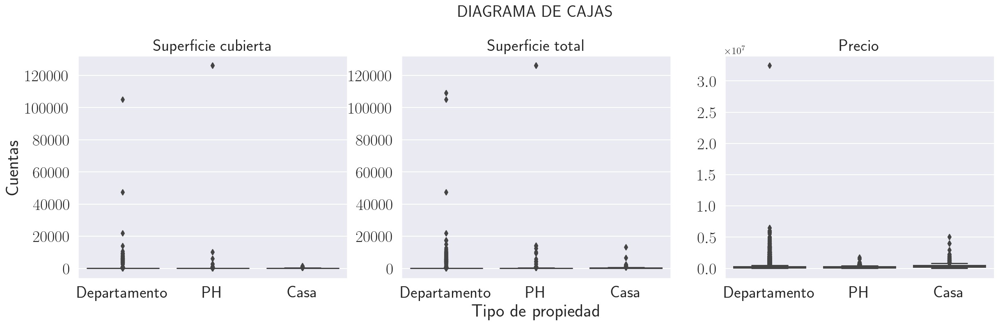

In [14]:
plt.figure(figsize=(20,5))
sns.set(font_scale=1.1)
ax1 = plt.subplot(131)
ax1 = sns.boxplot( x=df['property_type'], y=df['surface_covered'], palette="Reds");
ax1.set_ylabel('Cuentas',fontsize=22)
ax1.set_xlabel('',fontsize=0)
# title
ax1.set_title('Superficie cubierta',fontsize=20)
plt.setp(ax1.get_xticklabels(), visible=True,fontsize = 20)
plt.setp(ax1.get_yticklabels(), visible=True,fontsize = 20)
#plt.title(title, loc='left',fontsize=18)

ax2 = plt.subplot(132)
ax2 = sns.boxplot( x=df['property_type'], y=df['surface_total'], palette="Reds");
plt.setp(ax2.get_yticklabels(), visible=True)
ax2.set_ylabel('',fontsize=15)
ax2.set_xlabel('Tipo de propiedad',fontsize=22)
plt.setp(ax2.get_xticklabels(), visible=True,fontsize = 20)
plt.setp(ax2.get_yticklabels(), visible=True,fontsize = 20)
# title
ax2.set_title("DIAGRAMA DE CAJAS\n\n Superficie total", fontsize = 20)

ax3 = plt.subplot(133)
ax3 = sns.boxplot( x=df['property_type'], y=df['price'], palette="Reds");

plt.setp(ax3.get_xticklabels(), visible=True,fontsize = 20)
plt.setp(ax3.get_yticklabels(), visible=True,fontsize = 20)
ax3.set_ylabel('',fontsize=0)
ax3.set_xlabel('',fontsize=0)
# title
ax3.set_title('Precio',fontsize=20);

Observamos que las información relevante de los diagramas de cajas se ve apantallada por los valores atípicos presentes, detallemos un poco más esto "midiendo" la forma de la distribución de los datos. 

In [15]:
import scipy.stats as ss
if ss.skew(df.surface_total)>0:
    print('La distribución de superficie total tiene cola a la derecha')
else:
    print('La distribución de superficie total a la izquierda')
if ss.skew(df.surface_covered)>0:
    print('La distribución de superficie cubierta tiene cola a la derecha')
else:
    print('La distribución de superficie cubierta a la izquierda')
if ss.skew(df.price)>0:
    print('La distribución de precios tiene cola a la derecha')
else:
    print('La distribución de precios cubierta a la izquierda')

La distribución de superficie total tiene cola a la derecha
La distribución de superficie cubierta tiene cola a la derecha
La distribución de precios tiene cola a la derecha


Con esta información optamos por hacer cortes en la distribución por el críterio de 3\sigmas. En el proyecto 1 [ver aquí](https://jdrincone.github.io/Portafolio/post/proyect-2/) análizamos en detalle otros criterios.

<a id="s-113a"></a>
# Criterio de las 3$\sigma$ 


Como calculamos antes, las distribuciones tienes colas alargadas hacia la derecha, por tanto miremos que tan larga es esta cola en unidades de $\sigma$:

In [16]:
st = (df.surface_total.max()-df.surface_total.mean())/df.surface_total.std()
sc = (df.surface_covered.max()-df.surface_covered.mean())/df.surface_covered.std()
sp = (df.price.max()-df.price.mean())/df.price.std()
print(f'En la distribución de superficie total, su valor máximo esta a: {int(st)} sigmas de su valor medio.\n' )
print(f'En la distribución de superficie cubierta, su valor máximo esta a: {int(sc)} sigmas de su valor medio.\n' )
print(f'En la distribución de precios, su valor máximo esta a: {int(sp)} sigmas de su valor medio.' )

En la distribución de superficie total, su valor máximo esta a: 126 sigmas de su valor medio.

En la distribución de superficie cubierta, su valor máximo esta a: 162 sigmas de su valor medio.

En la distribución de precios, su valor máximo esta a: 97 sigmas de su valor medio.


Como se puede observar, el dato mayor de cada distribución está alejado del valor medio de la distribución en un orden de aproximadamente 100 unidades de sigmas. Nosotros nos quedaremos solo con 3$\sigma$, ya que este criterio nos asegura que para una distribución normal, se conservaría el 99.7% de la información. Para nuestro caso particular, al ver que no es una distribución Gaussiana, este porcentaje será menor, pero observaremos que se siguen conservando la mayoría de los datos.

In [17]:
cut_total =df.surface_total.mean()+3*df.surface_total.std()
cut_cubierta = df.surface_covered.mean()+3*df.surface_covered.std()
cut_price = df.price.mean()+3*df.price.std()

dnew = df[(df.price<=cut_price) & (df.surface_covered<=cut_cubierta) & (df.surface_total<=cut_total)]
print("Porcentaje de datos conservados:")
print(f"{np.round((dnew.shape[0]/df.shape[0])*100, 2)}%")

Porcentaje de datos conservados:
98.06%


Como se observa el criterio de las 3$\sigma$ conserva un alto porcentaje de los datos. Ahora miremos el nuevo boxplot con los datos depurados con este criterio:

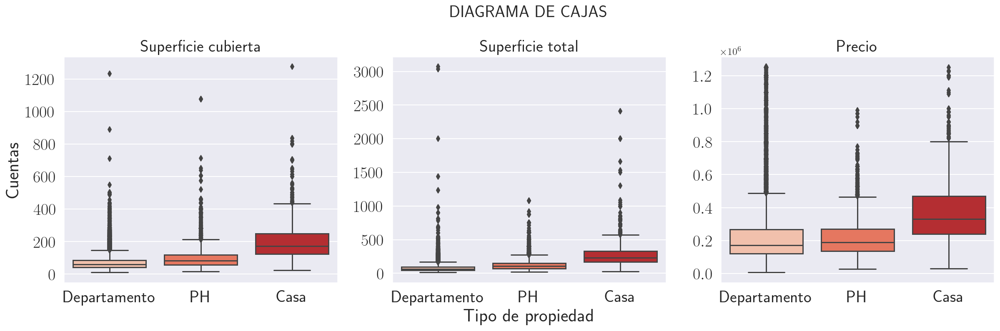

In [18]:
plt.figure(figsize=(20,5))
sns.set(font_scale=1.1)
ax1 = plt.subplot(131)
ax1 = sns.boxplot( x=dnew['property_type'], y=dnew['surface_covered'], palette="Reds");
ax1.set_ylabel('Cuentas',fontsize=22)
ax1.set_xlabel('',fontsize=0)
# title
ax1.set_title('Superficie cubierta',fontsize=20)
plt.setp(ax1.get_xticklabels(), visible=True,fontsize = 20)
plt.setp(ax1.get_yticklabels(), visible=True,fontsize = 20)
#plt.title(title, loc='left',fontsize=18)

ax2 = plt.subplot(132)
ax2 = sns.boxplot( x=dnew['property_type'], y=dnew['surface_total'], palette="Reds");
plt.setp(ax2.get_yticklabels(), visible=True)
ax2.set_ylabel('',fontsize=15)
ax2.set_xlabel('Tipo de propiedad',fontsize=22)
plt.setp(ax2.get_xticklabels(), visible=True,fontsize = 20)
plt.setp(ax2.get_yticklabels(), visible=True,fontsize = 20)
# title
ax2.set_title("DIAGRAMA DE CAJAS\n\n Superficie total", fontsize = 20)

ax3 = plt.subplot(133)
ax3 = sns.boxplot( x=dnew['property_type'], y=dnew['price'], palette="Reds");

plt.setp(ax3.get_xticklabels(), visible=True,fontsize = 20)
plt.setp(ax3.get_yticklabels(), visible=True,fontsize = 20)
ax3.set_ylabel('',fontsize=0)
ax3.set_xlabel('',fontsize=0)
# title
ax3.set_title('Precio',fontsize=20);

Observamos que el filtro aplicado permite dilucidar un poco la distribución de los datos, aún así continuamos teniendo muchos datos outliers en las variables continuas cuando las analizamos para cada tipo de propiedad.

Por último, miremos la forma final de las distribuciones de las variables continuas en función del tipo de propiedad:

In [19]:
def plot_distribucion(df, nombre):
    plt.figure(figsize=(25,15))
    sns.set(font_scale=1)
    ax1 = plt.subplot(231)
    ax1 = sns.distplot(df['surface_covered'],kde=True, bins=150, color='c' ,label= 'superficie cubierta');
    ax1.set_ylabel('Cuentas',fontsize=22)
    ax1.set_xlabel('',fontsize=0)
    if nombre=='DISTRIBUCIONES ORIGINALES':
        ax1.set_xlim(0,600)
    # title
    ax1.set_title('Superficie cubierta',fontsize=20)
    plt.setp(ax1.get_xticklabels(), visible=True,fontsize = 20)
    plt.setp(ax1.get_yticklabels(), visible=True,fontsize = 20)
    #plt.title(title, loc='left',fontsize=18)

    ax2 = plt.subplot(232)
    ax2 = sns.distplot(df['surface_total'],kde=True, bins=150, color='c',label= 'superficie total');
    plt.setp(ax2.get_yticklabels(), visible=True)
    ax2.set_ylabel('',fontsize=15)
    ax2.set_xlabel('',fontsize=22)
    plt.setp(ax2.get_xticklabels(), visible=True,fontsize = 20)
    plt.setp(ax2.get_yticklabels(), visible=True,fontsize = 20)
    # title
    ax2.set_title(nombre+"\n\n Superficie total", fontsize = 20)
    if nombre=='DISTRIBUCIONES ORIGINALES':
        ax2.set_xlim(0,600)
    ax3 = plt.subplot(233)
    ax3 = sns.distplot(df['price'],kde=True, label= 'precio', color='r');

    plt.setp(ax3.get_xticklabels(), visible=True,fontsize = 20)
    plt.setp(ax3.get_yticklabels(), visible=True,fontsize = 20)
    ax3.set_ylabel('',fontsize=0)
    ax3.set_xlabel('',fontsize=0)
    # title
    ax3.set_title('Precio',fontsize=20);



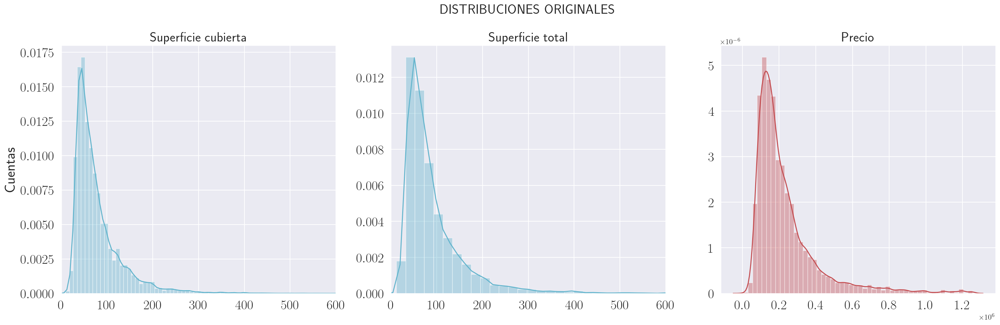

In [20]:
plot_distribucion(dnew,'DISTRIBUCIONES ORIGINALES')

Aunque poseemos valores 'atípicos' los distribuciones asemejan 'funciones' bien comportadas en las colas, por lo tanto evitaremos de esta forma realizar algun tipo de corte adicional a los datos.

Dejamos en **rojo** la distribución de valores de precio ya que será nuestra variable a predecir, y es de vital importancia conocer la forma de su distribución ya que los modelos de machine learning performance mejor cuando la variable a predecir posee una distribución normal o pertenece a la familia de funciones exponenciales. 

Para saber si nuestra distribución **roja** pertence a este conjunto de funciones se debe realizar un fitting y encontrar la mejor función que se ajusta a dicha distribución, aunque es información supremamente relevante (que todo data sciencie debe manejar) lo omitiré.
Por el momento con prueba y error transformaremos, las variables continuas (todas) con las funciones más habituales que se usan.

<a id="s-113b"></a>
### Transformación variables continuas

#### Raiz cuadrada

In [21]:
d_continue = dnew[['surface_total','surface_covered','price']]
d_nocontinue =dnew [['rooms','bedrooms','bathrooms','property_type','l3']]
d_raiz = np.sqrt(d_continue )
dnew_raiz = pd.concat([d_nocontinue,d_raiz], axis=1)


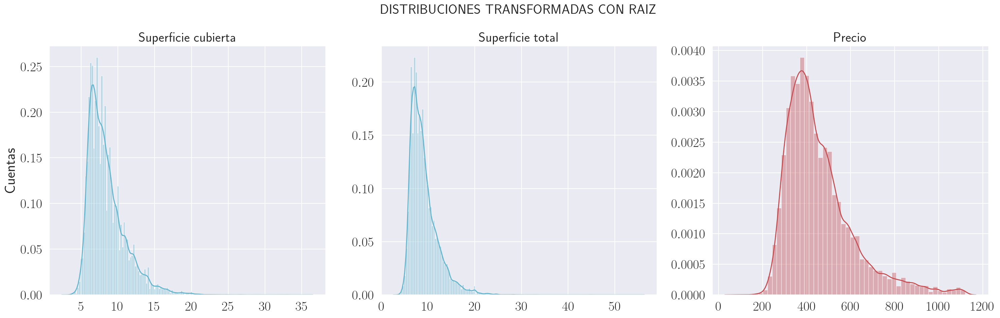

In [22]:
plot_distribucion(dnew_raiz,'DISTRIBUCIONES TRANSFORMADAS CON RAIZ')

#### Logaritmica

In [23]:
d_log = np.log(d_continue)
dnew_log = pd.concat([d_nocontinue,d_log], axis=1)

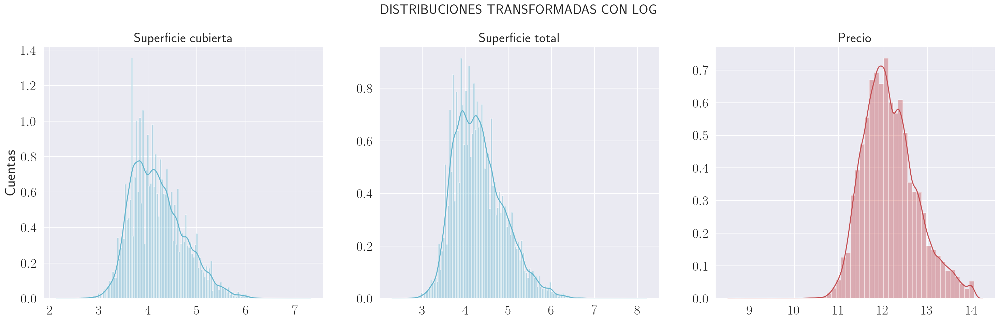

In [24]:
plot_distribucion(dnew_log,'DISTRIBUCIONES TRANSFORMADAS CON LOG')

En las anteriores transformaciones logramos de forma visual, reducir el dominio valores que puede tomar las variables y transformar un poco la forma de las distribuciones para que sean lo más 'similares' a una distribución normal. Observe que para lograr esto, el mejor comportamiento lo obtiene la trandformación logarítmica.

<a id="s-114"></a>
### Correlaciones

In [25]:
#plt.figure(dpi=150)
def corr_sinlatex():
    plt.figure(figsize=(25,15))
    sns.set(font_scale=1.2)
    sns.set(rc={'text.usetex': False})

    ax1 = plt.subplot(231)
    ax1 = sns.heatmap(dnew.corr(),  linewidth=0.3,cbar=False,vmin=-1,
                cmap='coolwarm',
                annot=True);
    ax1.set_xlabel('',fontsize=0)
    ax1.set_title('Datos originales\n',fontsize=30)
    plt.setp(ax1.get_xticklabels(), visible=True,fontsize = 20)
    plt.setp(ax1.get_yticklabels(), visible=True,fontsize = 20)
        #plt.title(title, loc='left',fontsize=18)

    ax2 = plt.subplot(232,sharey=ax1)
    ax2 = sns.heatmap(dnew_raiz.corr(),linewidth=0.3, cbar=False,vmin=-1,
                cmap='coolwarm',
                annot=True);
    ax2.set_ylabel('',fontsize=15)
    ax2.set_xlabel('',fontsize=22)
    plt.setp(ax2.get_yticklabels(), visible=False)
    plt.setp(ax2.get_xticklabels(), visible=True,fontsize = 20)
    plt.setp(ax2.get_yticklabels(), visible=True,fontsize = 20)
        # title
    ax2.set_title("Datos transformados\n Raiz\n", fontsize = 30)

    ax3 = plt.subplot(233,sharey=ax1)
    ax3 = sns.heatmap(dnew_log.corr(), linewidth=0.3,vmin=-1,
                cmap='coolwarm',
                annot=True);

    plt.setp(ax3.get_xticklabels(), visible=True,fontsize = 20)
    plt.setp(ax3.get_yticklabels(), visible=False)
    ax3.set_ylabel('',fontsize=0)
    ax3.set_xlabel('',fontsize=0)
        # title
    ax3.set_title("Datos transformados\n Log\n", fontsize = 30);


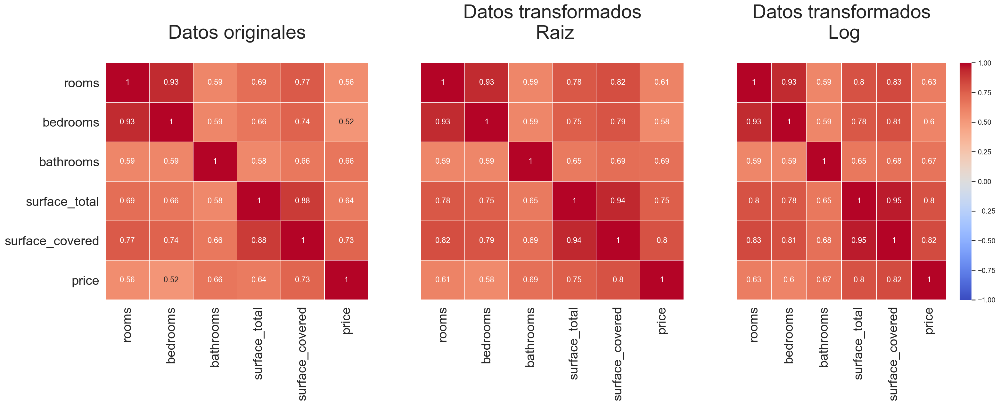

In [26]:
corr_sinlatex()

Esta tabla de correlación nos brinda mucha información:
- Vemos que las variables altamente correlacionadas con el precio de una propiedad son superficie cubierta y superficie total, en adición, todas las variables númericas contribuyen positivamente a la correlacción del precio del inmueble.
- Vemos que la transformación de los datos aumenta la correlación siendo mayor la obtenida con la tranformación logarítmica y por lo cual usaremos en el transcurso del notebook.
- Por último, la correlación nos muestra un futuro problema que tenedremos que solucionar a la hora de tener un mejor performace en los modelos de regresión. Pues dichos modelos se ven perjudicados por la incorporación de predictores correlacionados, que es lo que esta pasando en este caso con la superficie total y cubierta.

<a id="s-13"></a>
# Variables númericas discretas
 A continuación analizamos el ultimo feature que nos falta, y es bathrooms

In [27]:
k = dnew_log.isna().sum()
k[k!=0]

bathrooms    827
dtype: int64

Para llenar los valores faltantes en baños, proponemos un predictor que dado la información de las demás variables, nos diga cuantos baños posee el inmueble

<a id="s-131"></a>
# Clasificador para predición de bathrooms
Debemos implementar un clasificador y no un regresor para la predición del número de baños, debido que estamos hablando de una variable númerica **discreta**

In [28]:
dnew_log

,rooms,bedrooms,bathrooms,property_type,l3,surface_total,surface_covered,price
0,7.0,7.0,2.0,Departamento,San Cristobal,4.941642,4.941642,11.938193
1,2.0,1.0,2.0,PH,Boedo,4.248495,4.060443,11.976659
2,2.0,1.0,1.0,PH,Palermo,3.806662,3.806662,11.736069
3,2.0,1.0,1.0,PH,Palermo,4.442651,3.912023,12.594731
5,2.0,1.0,1.0,PH,Villa Crespo,4.025352,4.025352,11.918391
...,...,...,...,...,...,...,...,...
146553,4.0,3.0,2.0,Departamento,Palermo,4.663439,4.605170,13.337475
146554,4.0,3.0,3.0,PH,Palermo,5.164786,4.709530,13.253392
146555,3.0,2.0,2.0,PH,Palermo,4.969813,4.897840,13.081541
146556,4.0,2.0,2.0,PH,Palermo,5.758902,4.962845,13.180632


In [29]:
#division del conjunto de trabajo
dnull = dnew_log[dnew_log.bathrooms.isna()] #dataframe with null values
dgo = dnew_log.dropna(subset=['bathrooms']) #dataframe free null values

In [30]:
#Conjunto de entrenamiento 
X_go = dgo.drop(['bathrooms'], axis=1)  #Conjunto de entrenamiento 
y_go = dgo.bathrooms
#Conjunto para predecir el banno (similar al conjunto test, pero en este caso no se tiene bannos para comprobar) 
X_null= dnull.drop(['bathrooms'], axis=1) 


<a id="s-1r"></a>
## Transformación: Standard Scaler and OneHotEncoder

In [31]:
#funcion para preprocesar los datos

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.compose import make_column_selector 

def prepocesar(X):
        
        '''Se estandarizan las columnas numéricas y se hace one-hot-encoding de las 
            columnas cualitativas. Para mantener las columnas a las que no se les aplica 
            ninguna transformación se tiene que indicar remainder='passthrough'.'''
        
        numeric_cols = X.select_dtypes(include=['float64', 'int']).columns.to_list()
        cat_cols = X.select_dtypes(include=['object', 'category']).columns.to_list()
        preprocessor = ColumnTransformer(
                   [('scale', StandardScaler(), numeric_cols),
                    ('onehot', OneHotEncoder(handle_unknown='ignore',sparse=False), cat_cols)],
                remainder='passthrough')

        X_prep = preprocessor.fit_transform(X)
        # Convertir el output en dataframe y añadir el nombre de las columnas
        encoded_cat = preprocessor.named_transformers_['onehot'].get_feature_names(cat_cols)
        labels = np.concatenate([numeric_cols, encoded_cat])
        datos_prep = pd.DataFrame(X_prep, columns=labels)
        return datos_prep

        

In [32]:
X = prepocesar(X_go) #conjunto para entrenar procesados
X_n = prepocesar(X_null) #conjunto para predecir procesados

In [33]:
#Solo entrenaremos con las columnas que se repiten en ambos conjuntos
X = X[X_n.columns]

In [34]:
#Dividir y entrenar el modelo

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y_go, test_size=0.3, random_state=2021)

In [35]:
from sklearn.tree import DecisionTreeClassifier


#Números enteros de 1 a 50
max_depth_values = np.arange(1, 51, 1)

#Arreglos vacíos para almacenar el error de entrenamiento y el de generalización.
train_error = np.empty(len(max_depth_values))
generalization_error = np.empty(len(max_depth_values))


for depth in max_depth_values:
    #Entrenamos
    decision_tree = DecisionTreeClassifier(max_depth = depth)
    decision_tree.fit(X_train, y_train)
    train_error[depth - 1] = (1 - decision_tree.score(X_train, y_train))
    generalization_error[depth - 1] = (1 - decision_tree.score(X_test, y_test))


In [36]:
#habilitamos latex
rc('text', usetex=True)
rc('font', family='serif')

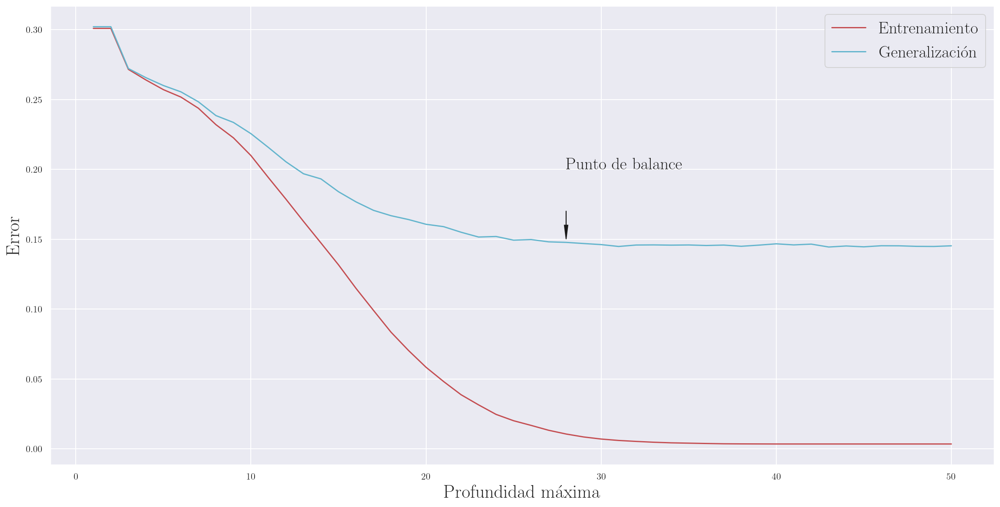

In [37]:
plt.figure(figsize=(20,10))
plt.plot(max_depth_values, train_error, label="Entrenamiento", c='r')
plt.plot(max_depth_values, generalization_error, label="Generalización",c='c')
#plt.xticks(max_depth_values)
plt.xlabel("Profundidad máxima",fontsize=22); 
plt.ylabel("Error",fontsize=22);
plt.arrow(28, 0.17, 0, -0.01, head_width=0.2, head_length=0.01, fc='k', ec='k')
plt.text(28, 0.20, 'Punto de balance',fontsize=20)

plt.legend(fontsize=20);

In [38]:
# Creación del modelo
# ------------------------------------------------------------------------------
modelo = DecisionTreeClassifier(
            max_depth         = 28,
            criterion         = 'gini',
            random_state      = 2021
          )

# Entrenamiento del modelo
# ------------------------------------------------------------------------------
modelo.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=28, random_state=2021)

In [39]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
# Error de test del modelo
#-------------------------------------------------------------------------------
predicciones = modelo.predict(X = X_test)

print("Matriz de confusión")
print("-------------------")
confusion_matrix(
    y_true    = y_test,
    y_pred    = predicciones
)

Matriz de confusión
-------------------


array([[13424,  1075,    76,    10,     0,     0,     0,     0,     2,
            2,     1],
       [ 1002,  4758,   368,    63,    12,     1,     0,     0,     1,
            0,     0],
       [   89,   405,  1269,    71,    14,     0,     0,     0,     0,
            0,     0],
       [    8,    93,    77,   301,    18,     2,     1,     0,     0,
            0,     0],
       [    1,     9,     6,    10,    57,     0,     0,     0,     0,
            0,     0],
       [    0,     1,     4,     1,     0,     9,     0,     0,     0,
            0,     0],
       [    0,     1,     0,     0,     1,     1,     1,     0,     0,
            0,     0],
       [    0,     0,     0,     0,     0,     0,     2,     0,     0,
            0,     0],
       [    1,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0],
       [    1,     1,     0,     0,     0,     0,     0,     0,     0,
            0,     0],
       [    0,     0,     0,     0,     0,     0,     0,    

La matriz de confución nos indica que tanto se 'confundío' el modelo en el entrenamiento, esto lo inferimos de los elementos fuera de la diagonal o elementos de mezcla, observese que para inmuebles con mayor número de baños, el modelo no funciona también, esto se debe a que entrenamos un clasificador con **14** posibles clases, pero estas clases son primordialmente las 5 primeras, las demás juntas suman menos del 10% del todal de la clase principal (dejo al lector que demuestre esta afirmación).

Para mejorar el performance podríamos simplemente reducir las clases a 6, donde la sexta contenga la información de casas con 6,7,...,14 baños.


In [40]:

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = predicciones,
            normalize = True
           )
print(f"El accuracy de test es: {np.round(100 * accuracy,1)} %")

El accuracy de test es: 85.2 %


El modelo inicial es capaz de predecir correctamente un 85 % de las observaciones del conjunto de entrenamiento. Por tanto no mejoraremos el modelo aunque en principio se puede sin mucho esfuerzo.

In [41]:
#predecimos los valores de los bannos para las instancias que no tienen
new_predition = modelo.predict(X = X_n) 
new_bathrooms = pd.DataFrame(new_predition,columns=['bathrooms'] )

In [42]:
X_null = X_null.reset_index(drop=True)
X_null['bathrooms'] = new_bathrooms
dgo = dgo.reset_index(drop=True)
dgo

,rooms,bedrooms,bathrooms,property_type,l3,surface_total,surface_covered,price
0,7.0,7.0,2.0,Departamento,San Cristobal,4.941642,4.941642,11.938193
1,2.0,1.0,2.0,PH,Boedo,4.248495,4.060443,11.976659
2,2.0,1.0,1.0,PH,Palermo,3.806662,3.806662,11.736069
3,2.0,1.0,1.0,PH,Palermo,4.442651,3.912023,12.594731
4,2.0,1.0,1.0,PH,Villa Crespo,4.025352,4.025352,11.918391
...,...,...,...,...,...,...,...,...
77492,4.0,3.0,2.0,Departamento,Palermo,4.663439,4.605170,13.337475
77493,4.0,3.0,3.0,PH,Palermo,5.164786,4.709530,13.253392
77494,3.0,2.0,2.0,PH,Palermo,4.969813,4.897840,13.081541
77495,4.0,2.0,2.0,PH,Palermo,5.758902,4.962845,13.180632


In [43]:
X_complet = pd.concat([dgo,X_null],axis = 0) #dataset de trabajo
X_complet.isnull().sum() #limpio de valores nulos

rooms              0
bedrooms           0
bathrooms          0
property_type      0
l3                 0
surface_total      0
surface_covered    0
price              0
dtype: int64

<a id="s-2"></a>
#  Segunda parte: modelos simples mejorados
## Regresión para predición del precio

En esta sección se aconseja que el lector primero lea el primer proyecto publicado [aquí](https://jdrincone.github.io/Portafolio/post/proyect-2/), así podrá contrastar y entender mejor lo que se realiza a continuación.

In [44]:
X = X_complet.drop(columns = 'price') #Conjuto de entrenamiento
y = X_complet['price'] #Variable a predecir

In [45]:
X_p = prepocesar(X)

In [46]:
# División de los datos en train y test
# trabajando con trans raiz
# ------------------------------------------------------------------------------
X_train, X_test, y_train, y_test = train_test_split(X_p,y, test_size=0.3, random_state=2021)

<a id="s-21"></a>
### Benchmark

In [47]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
y_train_pred = linear_model.predict(X_train)
y_test_pred = linear_model.predict(X_test)
#y_train_pred = np.exp(y_train_pred)
#y_test_pred = np.exp(y_test_pred)
#y_train =np.exp(y_train)
#y_test = np.exp(y_test)
residuo = y_test_pred-y_test
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2 = r2_score(y_test, y_test_pred)

In [48]:
def grafica_diagnostico(y_test_pred,residuo,rmse_train,rmse_test,r2, modelo):
    ''' y_test_pred: arreglo de numpy de shape (n,) con la informacion de la variable predicha por el modelo
     residuo: error entre y_test_pred-y_test
     rmse_train,rmse_test,r2: m\'etricas de calificacion del modelo
     modelo: nombre del modelo usado en formato r'\textbf{nombre: }'
    Retorna: 
     m\'etricas de calificacion del modelo y 4 graficas del modelo: valor real vs, predicho, errores,
     distribucion errores y grafico q-q plot'''
    # ==============================================================================
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 15))
    #linea y=x
    xx = np.linspace(y_test.min()-0.1*y_test.mean(), y_test.max()+0.1*y_test.mean(),10000)
    yy = xx

    axes[0, 0].scatter(y_test_pred,y_test, c='c', alpha = 0.4)
    axes[0, 0].plot(xx,yy,'k--', color = 'black', lw=2)
    axes[0, 0].set_title(r'\textbf{Valor real vs valor predicho}', fontsize = 20)
    axes[0, 0].set_xlabel('Real',fontsize = 20)
    axes[0, 0].set_ylabel('Predicción',fontsize = 20)
    axes[0, 0].tick_params(labelsize = 17)

    axes[0, 1].scatter(list(range(len(y_test_pred))), residuo,c='purple', alpha = 0.4)
    axes[0, 1].axhline(y = 0, linestyle = '--', color = 'black', lw=2)
    axes[0, 1].set_title(r'\textbf{Residuos del modelo}', fontsize = 20)
    axes[0, 1].set_xlabel('Dato',fontsize = 20)
    axes[0, 1].set_ylabel('Residuo',fontsize = 20)
    axes[0, 1].tick_params(labelsize = 17)

    sns.distplot(residuo, bins = 200, label = 'train',color='purple',ax = axes[1, 0])

    axes[1, 0].set_title(r'\textbf{Distribución residuos del modelo}', fontsize = 20)
    axes[1, 0].set_xlabel("Residuo",fontsize = 20)
    axes[1, 0].set_ylabel("Cuentas",fontsize = 20)
    
    axes[1, 0].tick_params(labelsize = 17)

    import statsmodels.api as sm
    sm.qqplot(
        residuo,
        fit   = True,
        line  = 'q',
        ax    = axes[1, 1], 
        color = 'firebrick',
        alpha = 0.4,
        lw    = 2
    )
    axes[1, 1].set_title(r'\textbf{Q-Q residuos del modelo}', fontsize = 20)
    axes[1, 1].tick_params(labelsize = 17)
    axes[1, 1].set_ylabel("Datos ordenados",fontsize = 20)
    axes[1, 1].set_xlabel("Cuantiles Normal Estándar",fontsize = 20)

    fig.tight_layout()
    plt.subplots_adjust(top=0.9)
    fig.suptitle(modelo+r'\textbf{Diagnóstico}', fontsize = 25, fontweight = "bold");
    print('-----------------------------------------------------------------------------------------------')
    print(f'                             Raíz del error cuadrático medio en Train: {rmse_train:0.3f}')
    print(f'                             Raíz del error cuadrático medio en Test: {rmse_test:0.3f}')
    print(f'                             Coeficiente de Determinación por r2_score: {r2:0.3f}')
    print('-----------------------------------------------------------------------------------------------')



-----------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Train: 0.235
                             Raíz del error cuadrático medio en Test: 0.236
                             Coeficiente de Determinación por r2_score: 0.848
-----------------------------------------------------------------------------------------------


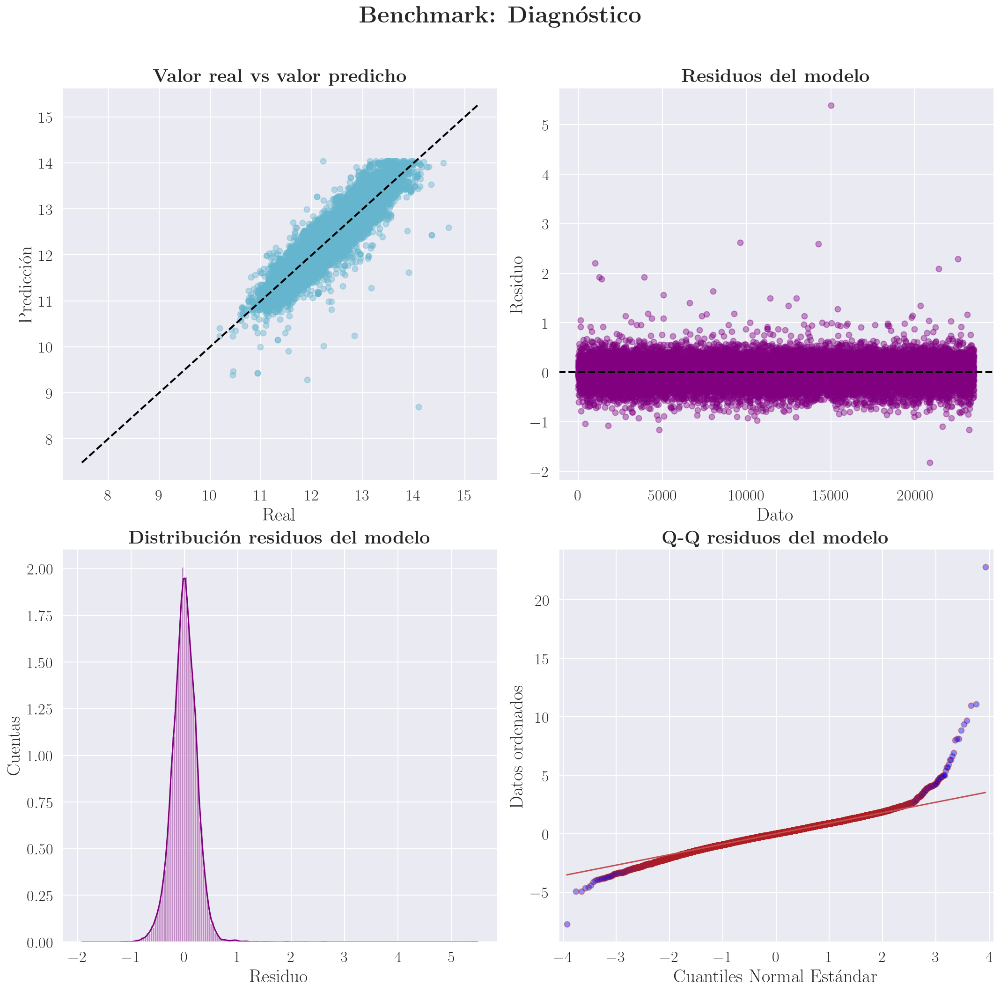

In [49]:
grafica_diagnostico(y_test_pred,residuo,rmse_train,rmse_test,r2,r'\textbf{Benchmark: }')

Al incluir las variables categoricas de barrio y tipo de propiedad mejora el performance de modelo Benchmark con respeto al proyecto 1, aún asi los valores atípicos que se encuentran principalmente en las colas de la distribución de precios (puede verse lo mismo en el extremo derecho de la gráfica qq-plot) son los que degeneran el modelo.
Las métricas evaluadas nos indican que las predicciones del modelo Benchmark se alejan en promedio 0.23 unidades del valor real (**RMSE**). Recuerde que estamos usando datos transformados por log. En adición, el modelos performace correctamente un 85 % de las observaciones del conjunto de test (**$R^2$**).

<a id="s-3rqqplot"></a>
### Nota sobre interpretación de errores a partir de la gráfica q-q plot

La gráfica q-q *compara* los cuantiles de los residuos (errores o discrepancias entre los valores reales y predichos en el conjunto de test) obtenidos con los cuantiles de la distribución distribución normal.
Dicha comparación permite saber en que cuantiles del conjunto nuestro modelo esta siendo más sesgado o cometiendo un mayor error, y esto se logra ver cuando los puntos rojos con un tono violeta en la gráfica q-q plot no estan sobre la línea roja (función y=x) que representa la distribución normal teórica.  En otras palabras, los puntos rojos con tonalidad violeta son aquellos cuantiles donde el modelo no posee un buen rendimiento. Vemos que estos cuantiles se encuentran en los extremos que es donde más valores atípicos poseemos.

<a id="s-3raciertos"></a>
## Aciertos y Desaciertos
A continuación miraremos el subconjunto de datos para el cual este modelo posee un mejor y peor rendimiento, esto lo haremos mirando donde es menor y mayor el error. En las funciones *aciertos_modelo* y *desaciertos_modelo* posee como parametro **arbitrario** el valor de *cota*, que me permite regular que tan 'extricto' deseo ser con el modelo.

In [50]:
def aciertos_modelo(residuo, cota = 0.0001):
    ''' residuo: Residuos obtenidos del modelo
    cota: Indica que tan pequenno deseamos el residuo, por defecto lo dejaremos en 0.0001, entre más cercano a cero
    más extrictos somos con el modelo.
    
    Imprime en pantalla los tipos de propiedad mejor predichos y a los barrios que pertenece
    Retorna el subconjunto de datos mejor predicho
     '''
    absresiduo = pd.DataFrame(np.abs(residuo))
    rr = absresiduo[absresiduo.price<cota]
    indice =rr.index
    tt =X_complet.iloc[indice, :]
    protiedades = pd.DataFrame(tt.property_type.value_counts())
    barrios = pd.DataFrame(tt.l3.value_counts())
    b5 = barrios.head(10)
    print("-----------------------------------------------")
    print('Tipos de propiedad que mejor predice el modelo')
    print("-----------------------------------------------")
    print(protiedades)
    print("-----------------------------------")
    print('Top 10 de los Barrios que mejor predice el modelo')
    print("-----------------------------------")
    print(b5)
    print("--------------------------------------------------------------------------------")
    print('                      Subconjunto de datos mejor predicho')
    print("--------------------------------------------------------------------------------")
    return tt

In [51]:
def desaciertos_modelo(residuo, cota = 2.5):
    ''' residuo: Residuos obtenidos del modelo
    cota: Indica que tan pequenno deseamos el residuo, por defecto lo dejaremos en 2.5, entre más lejano a cero
    más estamos pidiendo los peores datos.
    
    Imprime en pantalla los tipos de propiedad mejor predichos y a los barrios que pertenece
    Retorna el subconjunto de datos mejor predicho
     '''
    absresiduo = pd.DataFrame(np.abs(residuo))
    rr = absresiduo[absresiduo.price>cota]
    indice =rr.index
    tt =X_complet.iloc[indice, :]
    protiedades = pd.DataFrame(tt.property_type.value_counts())
    barrios = pd.DataFrame(tt.l3.value_counts())
    b5 = barrios.head(10)
    
    print("----------------------------------------------")
    print('Tipos de propiedad que peor predice el modelo')
    print("----------------------------------------------")
    print(protiedades)
    print("-----------------------------------")
    print('Barrios que peor predice el modelo')
    print("-----------------------------------")
    print(b5)
    print("--------------------------------------------------------------------------------")
    print('                      Subconjunto de datos peor predicho')
    print("--------------------------------------------------------------------------------")
    return tt

In [52]:
aciertos_modelo(residuo, cota = 0.0001)

-----------------------------------------------
Tipos de propiedad que mejor predice el modelo
-----------------------------------------------
              property_type
Departamento             15
-----------------------------------
Top 10 de los Barrios que mejor predice el modelo
-----------------------------------
           l3
Belgrano    5
Palermo     5
Nuñez       2
Flores      1
San Telmo   1
Recoleta    1
--------------------------------------------------------------------------------
                      Subconjunto de datos mejor predicho
--------------------------------------------------------------------------------


,rooms,bedrooms,bathrooms,property_type,l3,surface_total,surface_covered,price
58901,2.0,1.0,1.0,Departamento,Belgrano,3.871201,3.737670,11.976659
34243,1.0,1.0,1.0,Departamento,Nuñez,3.713572,3.610918,11.835009
35985,3.0,2.0,1.0,Departamento,Recoleta,4.762174,4.644391,12.733755
72934,2.0,1.0,1.0,Departamento,San Telmo,3.931826,3.931826,11.736069
28264,3.0,2.0,1.0,Departamento,Palermo,4.174387,4.174387,12.278393
67697,2.0,1.0,1.0,Departamento,Flores,3.737670,3.555348,11.396392
14129,2.0,1.0,1.0,Departamento,Belgrano,3.637586,3.637586,11.835009
21803,4.0,3.0,2.0,Departamento,Palermo,4.663439,4.564348,12.706848
52000,2.0,1.0,1.0,Departamento,Belgrano,4.127134,3.806662,12.111762
38822,2.0,1.0,1.0,Departamento,Belgrano,3.951244,3.555348,11.918391


In [53]:
desaciertos_modelo(residuo, cota = 2.5)

----------------------------------------------
Tipos de propiedad que peor predice el modelo
----------------------------------------------
              property_type
Departamento              3
-----------------------------------
Barrios que peor predice el modelo
-----------------------------------
               l3
Recoleta        1
Almagro         1
Puerto Madero   1
--------------------------------------------------------------------------------
                      Subconjunto de datos peor predicho
--------------------------------------------------------------------------------


,rooms,bedrooms,bathrooms,property_type,l3,surface_total,surface_covered,price
1543,3.0,2.0,1.0,Departamento,Almagro,4.094345,4.094345,9.287301
56259,4.0,3.0,3.0,Departamento,Recoleta,4.700480,4.634729,10.239960
63053,3.0,2.0,3.0,Departamento,Puerto Madero,5.616771,5.393628,8.699515


*En la conclusiones finales, dare un comentario sobre esta sección en todos los modelos.*

<a id="s-21a"></a>
### Importancia predictores para el Benchmark

In [54]:
# Coeficientes del modelo
# ==============================================================================
df_coeficientes = pd.DataFrame(
                        {'predictor': X_train.columns,
                         'coef': linear_model.coef_.flatten()}
                  )
df_coeficientes['abs'] = np.abs(df_coeficientes.coef)
df_coeficientes = df_coeficientes.sort_values('abs',ascending=False)

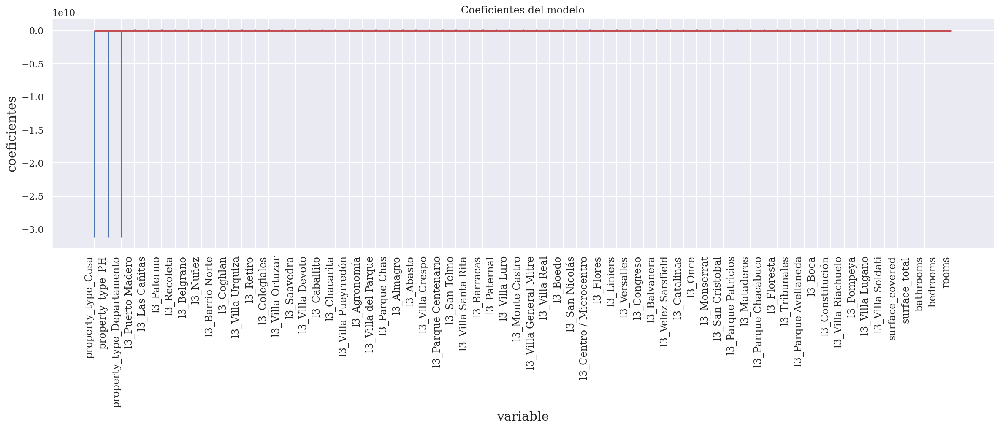

In [55]:
# plot
# ==============================================================================
rc('text', usetex=False)
fig, ax = plt.subplots(figsize=(20, 5))
ax.stem(df_coeficientes.predictor, df_coeficientes.coef, markerfmt=' ')
plt.xticks(rotation=90, ha='right', size=12)
ax.set_xlabel('variable',fontsize=15)
ax.set_ylabel('coeficientes',fontsize=15)
ax.set_title('Coeficientes del modelo');
rc('text', usetex=True)

Con esta gráfica de importancia de features en orden decreciente de importancia, vemos que el modelo de Benchmark presta muchisima más importancia a las variables categórica tanto que son opacadas por completo las variables númericas. Este dato sera de importancia para ver como trabajan los proximos modelos.

In [56]:
#Funcion para elegir modelo de entrenamiento

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score
def curva_complejidad_regresion(X_train, y_train, X_test, y_test, k_vals, modelo):
    """
     X_train: arreglo de numpy de shape (n, m) con las características de entrenamiento
     y_train: arreglo de numpy de shape (n,) con las etiquetas de clase de entrenamiento
     X_test: arreglo de numpy de shape (n, m) con las características de prueba
     y_test: arreglo de numpy de shape (n,) con las etiquetas de prueba
     k_vals: lista de valores de k
     modelo: 'knn' o 'tree'
    Retorna:
     lista con el RMSE para cada clasificador entrenado con los valores de k_vals
    """
    if(modelo == "knn"):
        rmse_test = []
        rmse_train = []
        for nn in k_vals:
            knn = KNeighborsRegressor(n_neighbors= nn)
            knn.fit(X_train, y_train)
            y_test_pred = knn.predict(X_test)
            y_train_pred = knn.predict(X_train)
            rmse_test.append(np.sqrt(mean_squared_error(y_test, y_test_pred)))
            rmse_train.append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
        return rmse_test, rmse_train
    
    elif(modelo == "tree"):
        rmse_test = []
        rmse_train = []
        for nn in k_vals:
            tree = DecisionTreeRegressor(max_depth=nn)
            tree.fit(X_train, y_train)
            y_test_pred = tree.predict(X_test)
            y_train_pred = tree.predict(X_train)
            rmse_test.append(np.sqrt(mean_squared_error(y_test, y_test_pred)))
            rmse_train.append(np.sqrt(mean_squared_error(y_train, y_train_pred)))
        return rmse_test, rmse_train

<a id="s-22"></a>
### Decision Tree Regressor

In [57]:
k_vals = list(range(1, 50))
rmse_test, rmse_train = curva_complejidad_regresion(X_train, y_train, X_test, y_test, k_vals, modelo="tree")

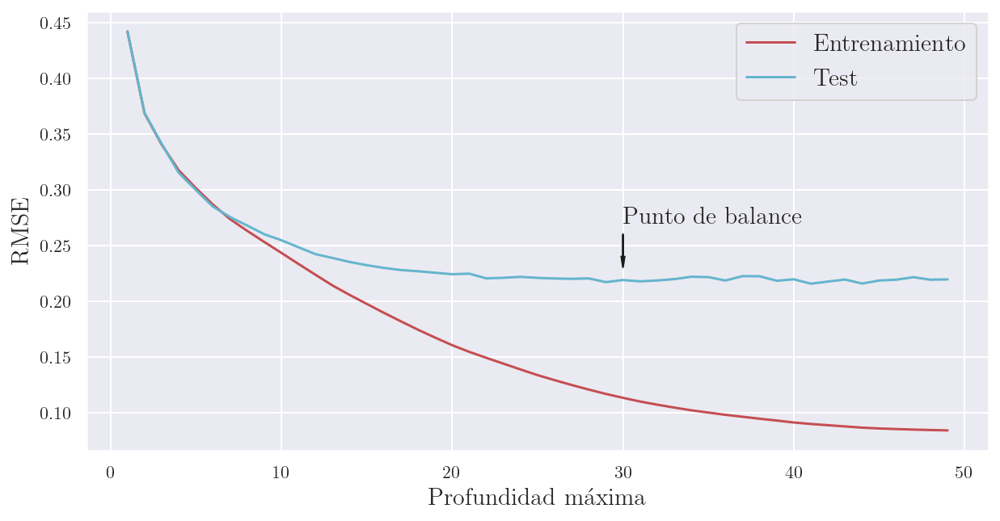

In [58]:
plt.figure(figsize=(10, 5))
plt.plot(k_vals, rmse_train, label='Entrenamiento', c='r')
plt.plot(k_vals, rmse_test, label='Test', c='c')
plt.xticks()
plt.xlabel("Profundidad máxima",fontsize=15); 
plt.ylabel("RMSE",fontsize=15);
plt.arrow(30, 0.26, 0, -0.020, head_width=0.2, head_length=0.01, fc='k', ec='k')
plt.text(30, 0.27, 'Punto de balance',fontsize=15)
plt.legend(fontsize=15);

El punto de balance nos muestra de forma gráfica el lugar óptimo donde el modelo no presenta ni overfitting ni underfitting, pero lo podemos comprobar con una optimización de hiperparámetros.

<a id="s-221"></a>
### Optimización de hiperparámetro **max_depth** con GridSearchCV

In [59]:
from sklearn.model_selection import GridSearchCV

In [60]:

grid_params = {
    'max_depth': list(range(1,30))
}

gs = GridSearchCV(DecisionTreeRegressor(),
                  grid_params,
                  verbose = 1,
                  cv = 5,
                  n_jobs = -1)

gs_results = gs.fit(X_train, y_train)

Fitting 5 folds for each of 29 candidates, totalling 145 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 145 out of 145 | elapsed:   17.8s finished


In [61]:
gs_results.best_params_

{'max_depth': 29}

In [62]:
gs_results.best_score_

0.8613855322353208

In [63]:
tree = DecisionTreeRegressor(max_depth= 29)
tree.fit(X_train, y_train)
y_test_pred = tree.predict(X_test)
y_train_pred = tree.predict(X_train)
residuo = (y_test_pred-y_test)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2 = r2_score(y_test, y_test_pred)


-----------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Train: 0.117
                             Raíz del error cuadrático medio en Test: 0.222
                             Coeficiente de Determinación por r2_score: 0.866
-----------------------------------------------------------------------------------------------


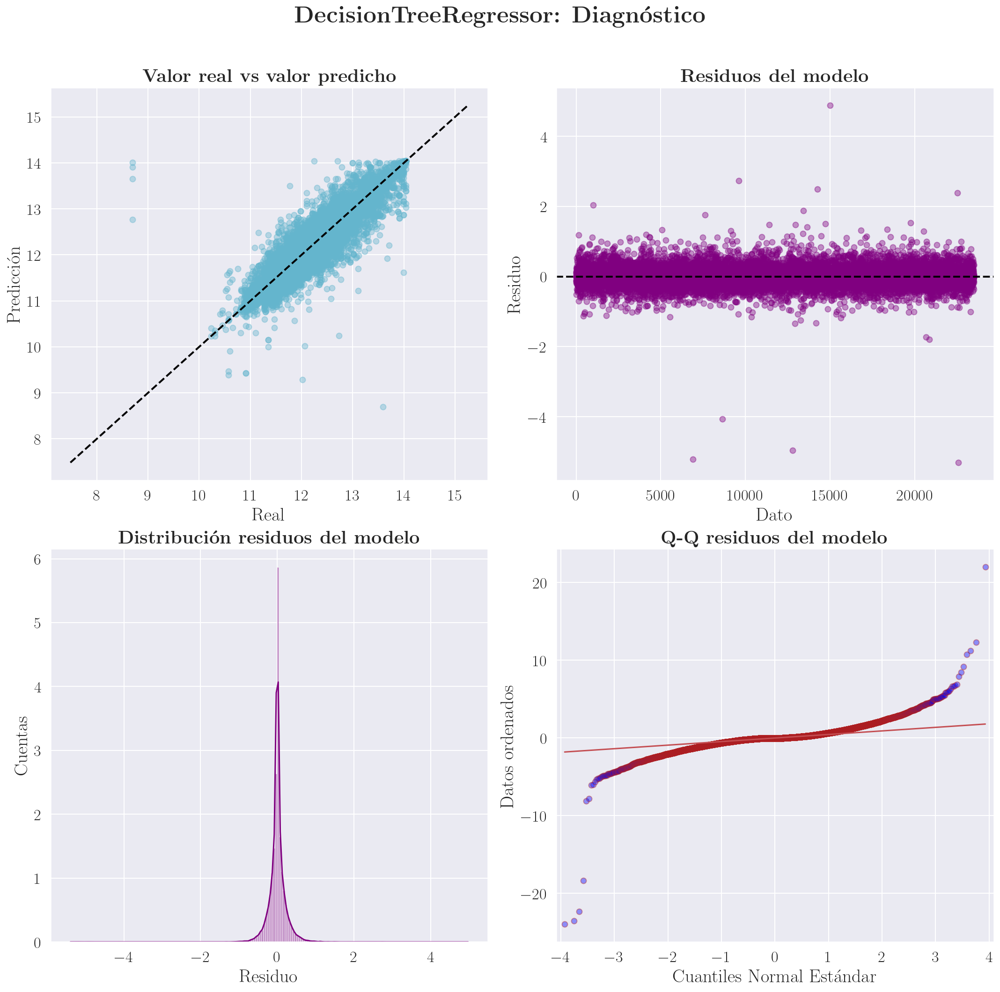

In [64]:
grafica_diagnostico(y_test_pred,residuo,rmse_train,rmse_test,r2, r'\textbf{DecisionTreeRegressor: }')

Las métricas evaluadas nos indican que las predicciones del modelo simple por arboles se alejan en promedio 0.22 unidades del valor real (RMSE). Recuerde que estamos usando datos transformados por log. En adición, el modelos performace correctamente un 86 % de las observaciones del conjunto de test (**$R^2$**). Nuevamente los valores atípicos degeneran el performance del modelo, el modelo funciona bn cuando los resudios estan entre los cuartiles [-2,2] si se comparan con una distribución teórica que sigue una normal (interpretación de la gráfica q-q plot).

<a id="s-3raciertos2"></a>
## Aciertos y Desaciertos

In [65]:
aciertos_modelo(residuo, cota = 0.0001)

-----------------------------------------------
Tipos de propiedad que mejor predice el modelo
-----------------------------------------------
              property_type
Departamento           2422
PH                      557
Casa                    104
-----------------------------------
Top 10 de los Barrios que mejor predice el modelo
-----------------------------------
                l3
Palermo        576
Recoleta       320
Belgrano       303
Almagro        237
Barrio Norte   199
Caballito      171
Villa Crespo   153
Villa Urquiza  114
Nuñez          103
Puerto Madero   91
--------------------------------------------------------------------------------
                      Subconjunto de datos mejor predicho
--------------------------------------------------------------------------------


,rooms,bedrooms,bathrooms,property_type,l3,surface_total,surface_covered,price
62151,3.0,2.0,3.0,Departamento,Puerto Madero,5.220356,5.220356,13.864301
68480,4.0,2.0,2.0,Departamento,Villa Urquiza,4.844187,4.718499,12.733755
16346,2.0,1.0,1.0,Departamento,Almagro,4.234107,4.174387,11.951180
75589,4.0,3.0,3.0,Departamento,Villa Urquiza,4.762174,4.615121,12.779873
64870,4.0,3.0,2.0,Departamento,Palermo,4.290459,4.189655,12.409013
...,...,...,...,...,...,...,...,...
64888,4.0,3.0,3.0,Departamento,Belgrano,4.795791,4.700480,13.081541
75982,3.0,2.0,2.0,PH,Caballito,5.147494,4.787492,12.323856
8475,6.0,5.0,3.0,PH,Monte Castro,5.749393,5.164786,12.538967
16051,7.0,6.0,2.0,PH,Villa Crespo,5.857933,5.857933,13.500800


In [66]:
desaciertos_modelo(residuo, cota = 2.5)

----------------------------------------------
Tipos de propiedad que peor predice el modelo
----------------------------------------------
              property_type
Departamento              6
-----------------------------------
Barrios que peor predice el modelo
-----------------------------------
               l3
Puerto Madero   2
Palermo         2
Belgrano        1
Almagro         1
--------------------------------------------------------------------------------
                      Subconjunto de datos peor predicho
--------------------------------------------------------------------------------


,rooms,bedrooms,bathrooms,property_type,l3,surface_total,surface_covered,price
5541,5.0,4.0,4.0,Departamento,Palermo,5.697093,5.697093,13.910821
48385,3.0,2.0,1.0,Departamento,Belgrano,5.820083,5.351858,12.765688
1543,3.0,2.0,1.0,Departamento,Almagro,4.094345,4.094345,9.287301
38998,5.0,4.0,3.0,Departamento,Puerto Madero,5.225747,5.225747,13.652992
63053,3.0,2.0,3.0,Departamento,Puerto Madero,5.616771,5.393628,8.699515
15633,4.0,3.0,3.0,Departamento,Palermo,5.834811,5.834811,14.006131


<a id="s-221a"></a>
### Importancia predictores

In [67]:
# Coeficientes del modelo
# ==============================================================================
df_coeficientes = pd.DataFrame(
                        {'predictor': X_train.columns,
                         'coef': tree.feature_importances_.flatten()}
                  )
df_coeficientes['abs'] = np.abs(df_coeficientes.coef)
df_coeficientes = df_coeficientes.sort_values('abs',ascending=False)

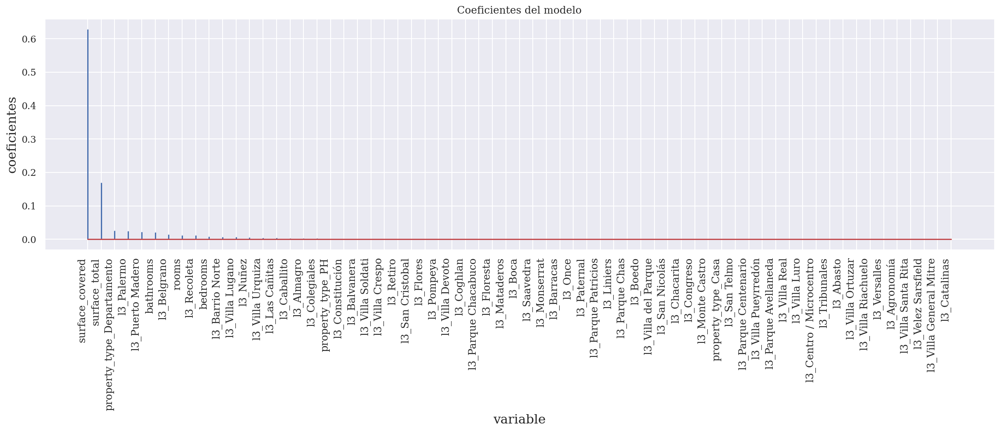

In [68]:
# plot
# ==============================================================================
rc('text', usetex=False)
fig, ax = plt.subplots(figsize=(20, 5))
ax.stem(df_coeficientes.predictor, df_coeficientes.coef, markerfmt=' ')
plt.xticks(rotation=90, ha='right', size=12)
ax.set_xlabel('variable',fontsize=15)
ax.set_ylabel('coeficientes',fontsize=15)
ax.set_title('Coeficientes del modelo');
rc('text', usetex=True)

En este caso vemos un cambio significante con respeto al modelo de base. Aunque se han obtenido valores en las métricas similares ultimos dos modelos, la importancia en los predictores es completamente diferente. En este caso se le da más importancia a las variables que están más correlacionas con la variable precio (recordad que encontramos en la sección de correlación que eran superficie cubierta y superficie total), luego en el nivel de importancia esta el tipo de propiedad departamentos, la cual representa la mayor parte de datos del conjunto (sección variables categoricas).

<a id="s-23"></a>
### KNeighbors Regressor

In [69]:
tiempo_inicial = time() 
k_vals = list(range(1, 30))
rmse_test, rmse_train = curva_complejidad_regresion(X_train, y_train, X_test, y_test, k_vals, modelo="knn")
tiempo_final = time() 
tiempo_ejecucion = tiempo_final - tiempo_inicial
print (f'Tenga presente que el tiempo de ejecución fue de {tiempo_ejecucion:0.4f} seguntos')

Tenga presente que el tiempo de ejecución fue de 2160.6507 seguntos


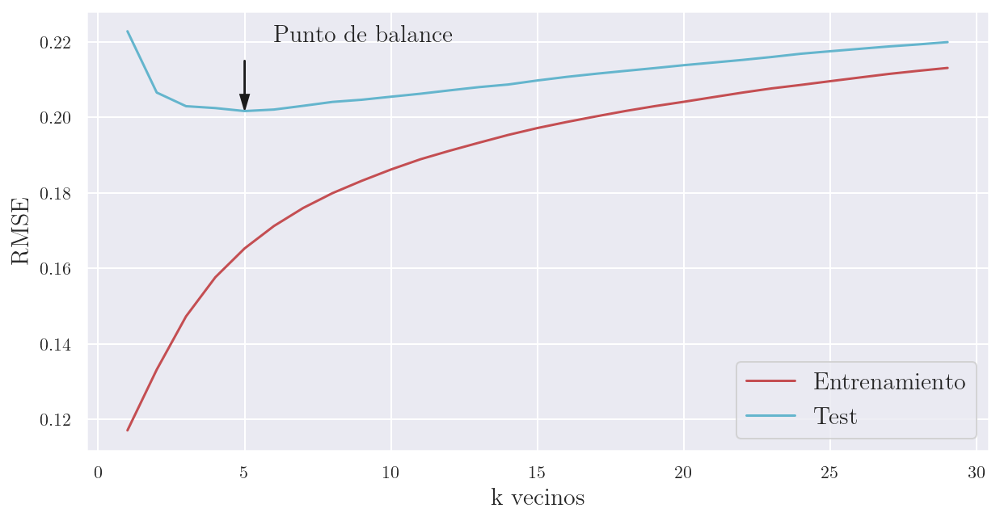

In [70]:
plt.figure(figsize=(10, 5))
plt.plot(k_vals, rmse_train, label='Entrenamiento', c='r')
plt.plot(k_vals, rmse_test, label='Test', c='c')
plt.xticks()
plt.xlabel("k vecinos",fontsize=15); 
plt.ylabel("RMSE",fontsize=15);
plt.arrow(5, 0.215, 0, -0.009, head_width=0.3, head_length=0.004, fc='k', ec='k')
plt.text(6, 0.22, 'Punto de balance',fontsize=15)
plt.legend(fontsize=15);

El punto de balance nos muestra de forma gráfica el lugar óptimo donde el modelo no presenta ni overfitting ni underfitting, pero lo podemos comprobar con una optimización de hiperparámetros.

 <a id="s-231"></a>
### Optimización de hiperparámetro **n_neighbors** con GridSearchCV

In [71]:
from sklearn.model_selection import GridSearchCV

grid_params = {
    'n_neighbors': list(range(1,30)),
    'metric': ['euclidean']
}

gs = GridSearchCV(KNeighborsRegressor(),
                  grid_params,
                  verbose = 1,
                  cv = 5,
                  n_jobs = -1)

gs_results = gs.fit(X_train, y_train)

Fitting 5 folds for each of 29 candidates, totalling 145 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 145 out of 145 | elapsed:  5.8min finished


In [72]:
gs_results.best_params_

{'metric': 'euclidean', 'n_neighbors': 5}

In [73]:
gs_results.best_score_

0.8837088978773254

In [74]:
knn = KNeighborsRegressor(n_neighbors= 5)
knn.fit(X_train, y_train)
y_test_pred = knn.predict(X_test)
y_train_pred = knn.predict(X_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2 = r2_score(y_test, y_test_pred)


-----------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Train: 0.165
                             Raíz del error cuadrático medio en Test: 0.202
                             Coeficiente de Determinación por r2_score: 0.889
-----------------------------------------------------------------------------------------------


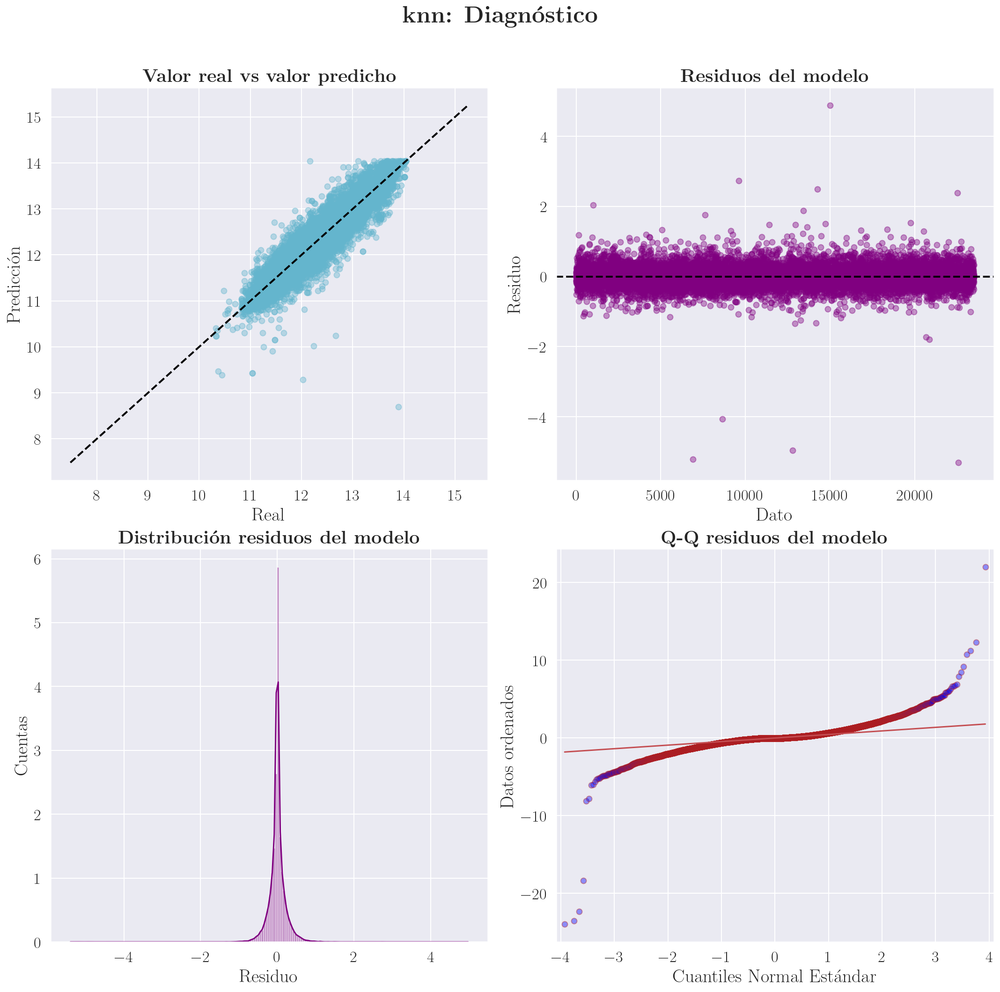

In [75]:
grafica_diagnostico(y_test_pred,residuo,rmse_train,rmse_test,r2, r'\textbf{knn: }')

Las métricas evaluadas nos indican que las predicciones del modelo simple por arboles se alejan en promedio 0.20 unidades del valor real (RMSE). Recuerde que estamos usando datos transformados por log. En adición, el modelos performace correctamente un 88 % de las observaciones del conjunto de test (**$R^2$**). Nuevamente los valores atípicos degeneran el performance del modelo, el modelo funciona bn cuando los resudios estan entre los cuartiles [-2,2] si se comparan con una distribución teórica que sigue una normal (interpretación de la gráfica q-q plot).

<a id="s-3raciertos3"></a>
## Aciertos y Desaciertos

In [76]:
aciertos_modelo(residuo, cota = 0.0001)

-----------------------------------------------
Tipos de propiedad que mejor predice el modelo
-----------------------------------------------
              property_type
Departamento           2422
PH                      557
Casa                    104
-----------------------------------
Top 10 de los Barrios que mejor predice el modelo
-----------------------------------
                l3
Palermo        576
Recoleta       320
Belgrano       303
Almagro        237
Barrio Norte   199
Caballito      171
Villa Crespo   153
Villa Urquiza  114
Nuñez          103
Puerto Madero   91
--------------------------------------------------------------------------------
                      Subconjunto de datos mejor predicho
--------------------------------------------------------------------------------


,rooms,bedrooms,bathrooms,property_type,l3,surface_total,surface_covered,price
62151,3.0,2.0,3.0,Departamento,Puerto Madero,5.220356,5.220356,13.864301
68480,4.0,2.0,2.0,Departamento,Villa Urquiza,4.844187,4.718499,12.733755
16346,2.0,1.0,1.0,Departamento,Almagro,4.234107,4.174387,11.951180
75589,4.0,3.0,3.0,Departamento,Villa Urquiza,4.762174,4.615121,12.779873
64870,4.0,3.0,2.0,Departamento,Palermo,4.290459,4.189655,12.409013
...,...,...,...,...,...,...,...,...
64888,4.0,3.0,3.0,Departamento,Belgrano,4.795791,4.700480,13.081541
75982,3.0,2.0,2.0,PH,Caballito,5.147494,4.787492,12.323856
8475,6.0,5.0,3.0,PH,Monte Castro,5.749393,5.164786,12.538967
16051,7.0,6.0,2.0,PH,Villa Crespo,5.857933,5.857933,13.500800


In [77]:
desaciertos_modelo(residuo, cota = 2.5)

----------------------------------------------
Tipos de propiedad que peor predice el modelo
----------------------------------------------
              property_type
Departamento              6
-----------------------------------
Barrios que peor predice el modelo
-----------------------------------
               l3
Puerto Madero   2
Palermo         2
Belgrano        1
Almagro         1
--------------------------------------------------------------------------------
                      Subconjunto de datos peor predicho
--------------------------------------------------------------------------------


,rooms,bedrooms,bathrooms,property_type,l3,surface_total,surface_covered,price
5541,5.0,4.0,4.0,Departamento,Palermo,5.697093,5.697093,13.910821
48385,3.0,2.0,1.0,Departamento,Belgrano,5.820083,5.351858,12.765688
1543,3.0,2.0,1.0,Departamento,Almagro,4.094345,4.094345,9.287301
38998,5.0,4.0,3.0,Departamento,Puerto Madero,5.225747,5.225747,13.652992
63053,3.0,2.0,3.0,Departamento,Puerto Madero,5.616771,5.393628,8.699515
15633,4.0,3.0,3.0,Departamento,Palermo,5.834811,5.834811,14.006131


 <a id="s-2r"></a>
# **Nueva sección**
## Comparación y explicación del desempeño de Modelos simples mejorados con Modelos de Machine learning del proyecto 1

En el **proyecto 1** [ver aquí](https://github.com/jdrincone/Mercado-Inmobiliario) hemos avanzado más de lo que se espera y hemos construido 2 seciones, la primera donde se entrenan los modelos de machine learning (Benchmark, Arbol decisión y Vecinos más cercados) con datos o predictores de tipo númerico: **rooms,	bedrooms,	bathrooms,	surface_total,	surface_covered** y estos sin una transformación previa. Con ello se obtiene:

| **Modelo**  | |**Métrica**  ||
| ---------- | ---------- | ---------- | ---------- |
| | **Rmse train** |**Rmse test** |$R^2$|
| Benchmark   |200764.339  |  198599.935  | 0.557   |
|  Tree   |  119970.703   | 152564.662   |0.739   |
|Knn |  114763.399 |149255.571  |0.750   |

En visto de estos resultados, en el proyecto 1 se realiza una previa transformación logarítmica de los datos [ver aquí], la cual fue aceptada por los evaluadores de acámica, con esta transformación solo a las variables númericas continuas del dataset, se obtuvo:

| **Modelo**  | |**Métrica**  ||
| ---------- | ---------- | ---------- | ---------- |
| | **Rmse train** |**Rmse test** |$R^2$|
| Benchmark   |0.342  | 0.338 |0.748  |
|  Tree   |   0.283   | 0.305  |0.794   |
|Knn |  0.258 |0.311  | 0.786  |

Como previamente concluimos en el proyecto 1. [...] En este punto vemos que tanto los modelos de regresión por knn y arboles han mejorado su desempeño con solo transformar los datos, aún así todavia podemos realizar algunas mejoras y así responder con mejores argumentos cual es el mejor modelo para la tarea de predición del precio de un inmueble.

Ahora en el **proyecto 2**, adicional a la transformación logarítmica de las variables númericas continuas (recordar que en la sección [*Transformación variables continuas*](#s-113b) explico el motivo de esta transformación, en adición en *The Elements of Statistical Learning Data Mining, Inference and Prediction* y un ejemplo practico de como trasformando la data del experimento de de un sistema de átomicos ultrafríos se lo encontrar la famosa distribución de sistemas que siguen la estadística de Fermiones [*Making, probing and understanding ultracold Fermi
gases*]( https://arxiv.org/pdf/0801.2500.pdf) se puede encontrar información del por que conviene transformar los datos) hemos incluido variables categoricas , **l2** y **property_type** y con esto obtenido el siguiente desempeño en los mismos modelos (sin cambiar sus hiperparámetros)

| **Modelo**  | |**Métrica**  ||
| ---------- | ---------- | ---------- | ---------- |
| | **Rmse train** |**Rmse test** |$R^2$|
| Benchmark   |0.235|  0.236 | 0.848  |
|  Tree   |   0.117   | 0.220 |0.869  |
|Knn |  0.258 |0.202  | 0.889 |

Podemos observar y concluir varias cosas de las tablas.
1. El simple hecho de realizar una transformación adecuada a las variables continuas, conlleva a obtener mejores resultados en las métricas de evaluación, independiente del modelo que se use. Esto para el caso del *rmse*  a disminuir el 'alejamiento' entre los valores reales y predichos, y con el *$R^2$* a aumentar el porcentaje de observaciones que constrastan con el modelo.

2. La inclusión de más información (mayor número de predictores) igualmente mejora el performance del modelo. En el caso de incluir las variables categoricas el modelo performa mejor, pero a medida que nos acercamos a $R^2\sim 1$ es más difícil aumentar el poder predictivo del modelo. Esto lo logramos solo un poco en la siguiente sección optimizando modelos avanzados.

3. Hay que tener encuenta que las métricas escogidas son sensibles a los valores atípico y aunque realizamos una eliminación parcial de ellos (en el sentido que preferimos tener más datos quedarnos con 3 $\sigma$, que eliminar estos sin un criterio propio del negocio) siempre es posible mejorar el modelo simplemente quitando datos molestos y esto se encuentra en la sección de extras.

 <a id="s-3"></a>
# Tercera parte: Modelos Avanzados

 <a id="s-31"></a>
# Regresión lineal incluyendo regularización en los coeficientes

La regresión lineal es un método estadístico que trata de modelar la relación entre una variable continua y una o más variables independientes mediante el ajuste de una ecuación lineal. Tres de las limitaciones (existen más que menciono en el proyecto1) que aparecen en la práctica al tratar de emplear este tipo de modelos (ajustados por mínimos cuadrados ordinarios) son:

- Se ven perjudicados por la incorporación de predictores correlacionados (*Caso que tenemos nosotros y mencionamos al inicio en la sección de correlación*).

- No realizan selección de predictores, todos los predictores se incorporan en el modelo aunque no aporten información relevante (algo que veremos que tenemos nosotros). Esto suele complicar la interpretación del modelo y reducir su capacidad predictiva.

- No pueden ajustarse cuando el número de predictores es superior al número de observaciones.

Una forma de atenuar el impacto de estos problemas es utilizar estrategias de regularización como ridge, Lasso que fuerzan a que los coeficientes del modelo tiendan a cero, minimizando así el riesgo de overfitting, reduciendo varianza, atenuado el efecto de la correlación entre predictores y reduciendo la influencia en el modelo de los predictores menos relevantes.

 <a id="s-311"></a>
## Regularización Ridge
La regularización Ridge penaliza la suma de los coeficientes elevados al cuadrado $||\beta||_1^2=\sum_j^p\beta_j^2$ . Ridge tiene el efecto de reducir de forma proporcional el valor de todos los coeficientes del modelo pero sin que estos lleguen a cero. El grado de penalización está controlado por el hiperparámetro $\alpha$. Cuando  $\alpha=0$, la penalización es nula y el resultado es equivalente al de un modelo lineal por mínimos cuadrados o Benchmark. A medida que  $\alpha$ aumenta, mayor es la penalización y menor el valor de los predictores.

In [78]:
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV

In [79]:
rg = Ridge()
rg.fit(X_train, y_train)
y_test_pred = rg.predict(X_test)
y_train_pred = rg.predict(X_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2 = r2_score(y_test, y_test_pred)
residuo =y_test-y_test_pred 


-----------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Train: 0.235
                             Raíz del error cuadrático medio en Test: 0.236
                             Coeficiente de Determinación por r2_score: 0.848
-----------------------------------------------------------------------------------------------


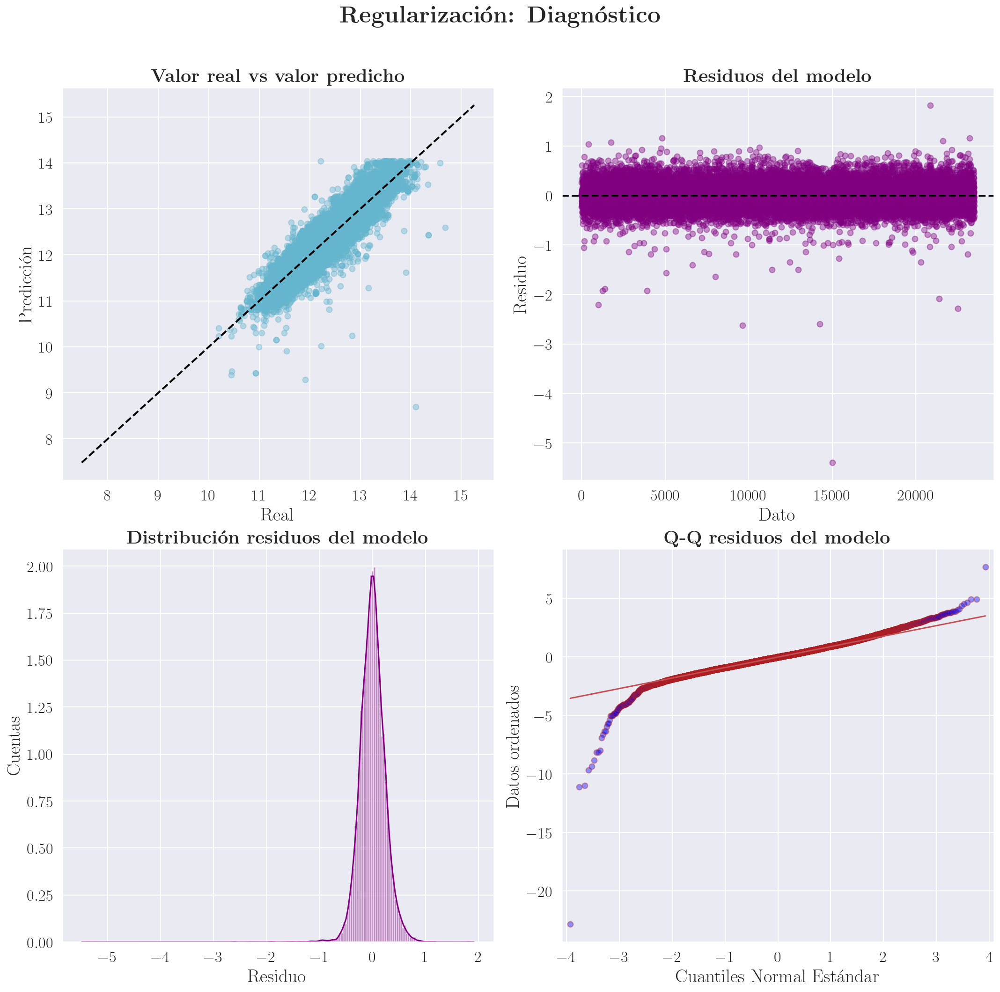

In [80]:

grafica_diagnostico(y_test_pred,residuo,rmse_train,rmse_test,r2,r'\textbf{Regularización: }')

Las métricas evaluadas nos indican que las predicciones del modelo simple por arboles se alejan en promedio 0.23 unidades del valor real (RMSE). Recuerde que estamos usando datos transformados por log. En adición, el modelos performace correctamente un 84 % de las observaciones del conjunto de test (**$R^2$**). Nuevamente los valores atípicos degeneran el performance del modelo, pero en este caso con la regulación de coeficientes, el modelo  aumento su espacio de predición: funciona bien cuando los resudios estan entre los cuartiles [-3,3] si se comparan con una distribución teórica que sigue una normal (interpretación de la gráfica q-q plot).

 <a id="s-311a"></a>
### Optimización de hiperparámetro alphas  con RidgeCV

Encontrar el mejor modelo implica identificar el valor óptimo del hiperparámetro de regularización alpha ( $\alpha$ que es en otros contextos un multiplicado de Lagrange). Al tratarse de un hiperparámetro, no hay forma de saber de antemano qué valor es el adecuado. Una forma de lograrlo es emplear validación cruzada o generalized cross validation, esta última es una adaptación eficiente de leave-one-out cross validation disponible para la regulación Ridge y usaremos a continuación. 

In [81]:
# Creación y entrenamiento del modelo (con búsqueda por CV del valor óptimo alpha)
# ==============================================================================
# Por defecto RidgeCV utiliza el mean squared error
from sklearn.linear_model import RidgeCV
modelo = RidgeCV(
            alphas          = np.logspace(-13, -8, 200),
            fit_intercept   = True,
            normalize       = True,
            store_cv_values = True
         )

_ = modelo.fit(X = X_train, y = y_train)

Cuando se utiliza regularización, es útil evaluar cómo se aproximan a cero los coeficientes a medida que se incrementa el valor de alpha así como la evolución del error de validación cruzada en función del $\alpha$ empleado.

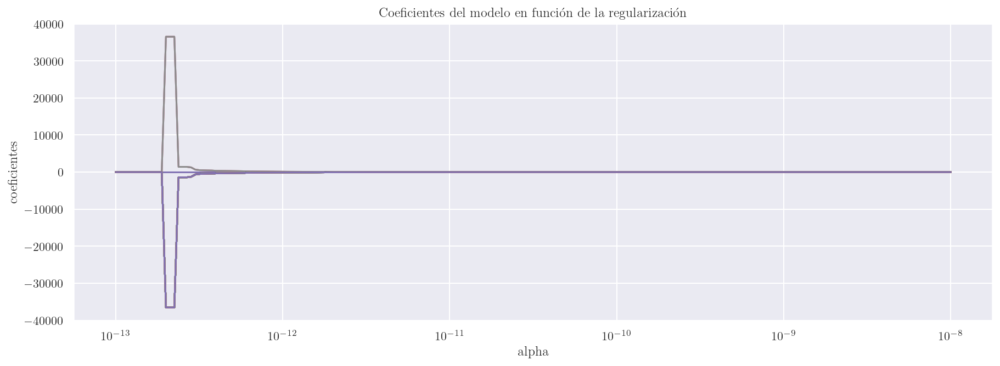

In [82]:
# Evolución de los coeficientes en función de alpha
# ==============================================================================
alphas = modelo.alphas
coefs = []

for alpha in alphas:
    modelo_temp = Ridge(alpha=alpha, fit_intercept=False, normalize=True)
    modelo_temp.fit(X_train, y_train)
    coefs.append(modelo_temp.coef_.flatten())

fig, ax = plt.subplots(figsize=(15, 5))
ax.plot(alphas, coefs)
ax.set_xscale('log')
ax.set_xlabel('alpha')
ax.set_ylabel('coeficientes')
ax.set_title('Coeficientes del modelo en función de la regularización');
plt.axis('tight')
plt.show()

Puede verse como, a medida que aumenta el valor de $\alpha$, la regularización es mayor y el valor de los coeficientes se reduce. De esta gráfica podemos concluir que a la rapida convergencia de los coeficientes al variar $\alpha$, no se tendra una mejora significante en el modelo entrenado inicialmente con los valores por defecto.

In [83]:
# Mejor valor alpha encontrado
# ==============================================================================
print(f"Mejor valor de alpha encontrado: {modelo.alpha_}")

Mejor valor de alpha encontrado: 1e-08


In [84]:
y_test_pred = modelo.predict(X_test)
y_train_pred = modelo.predict(X_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2 = r2_score(y_test, y_test_pred)
residuo =y_test-y_test_pred 


-----------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Train: 0.235
                             Raíz del error cuadrático medio en Test: 0.236
                             Coeficiente de Determinación por r2_score: 0.848
-----------------------------------------------------------------------------------------------


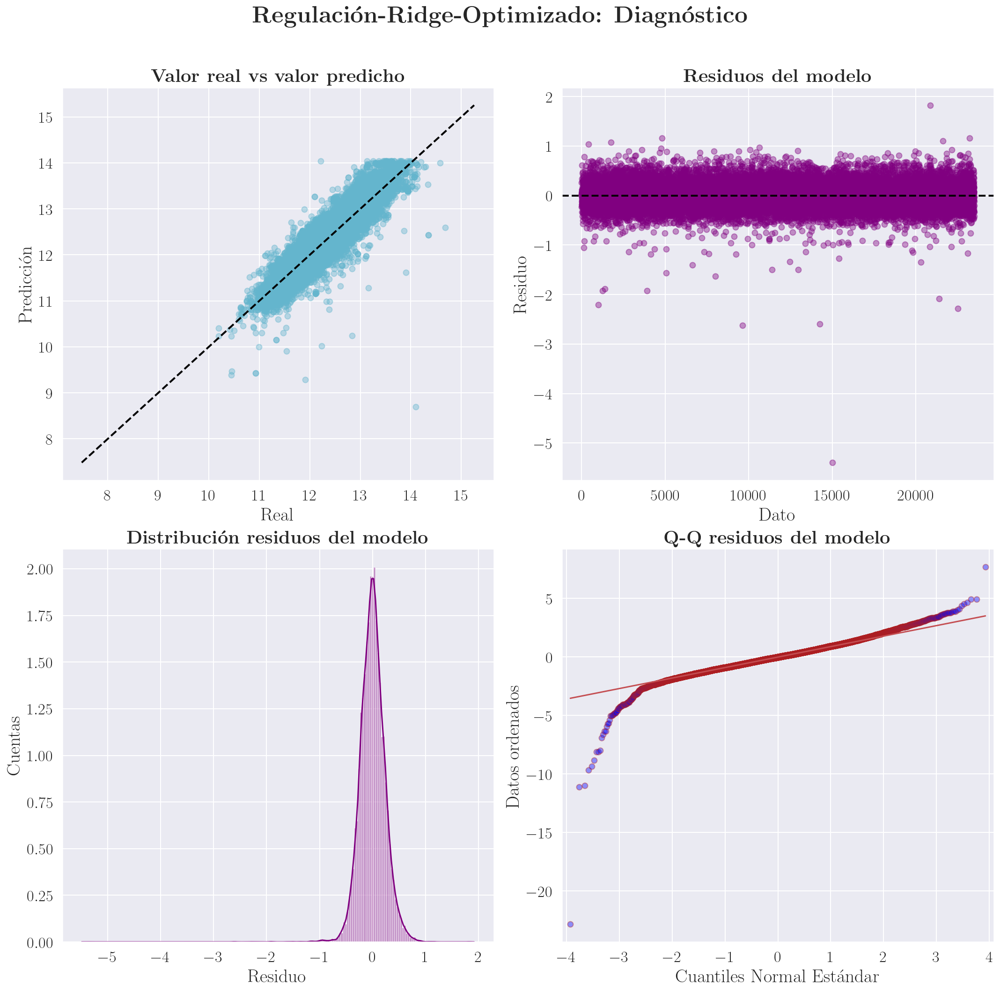

In [85]:
grafica_diagnostico(y_test_pred,residuo,rmse_train,rmse_test,r2,r'\textbf{Regulación-Ridge-Optimizado: }')

En este caso tenemos la misma conclusión dada en el modelo de Ridge sin optimización. Por último observemos como la regularización cambia el comportamiento de los coeficientes.

<a id="s-3raciertos4"></a>
## Aciertos y Desaciertos

In [86]:
aciertos_modelo(residuo, cota = 0.0001)

-----------------------------------------------
Tipos de propiedad que mejor predice el modelo
-----------------------------------------------
              property_type
Departamento             14
-----------------------------------
Top 10 de los Barrios que mejor predice el modelo
-----------------------------------
           l3
Palermo     5
Belgrano    4
Nuñez       2
Recoleta    1
Flores      1
San Telmo   1
--------------------------------------------------------------------------------
                      Subconjunto de datos mejor predicho
--------------------------------------------------------------------------------


,rooms,bedrooms,bathrooms,property_type,l3,surface_total,surface_covered,price
58901,2.0,1.0,1.0,Departamento,Belgrano,3.871201,3.737670,11.976659
34243,1.0,1.0,1.0,Departamento,Nuñez,3.713572,3.610918,11.835009
35985,3.0,2.0,1.0,Departamento,Recoleta,4.762174,4.644391,12.733755
72934,2.0,1.0,1.0,Departamento,San Telmo,3.931826,3.931826,11.736069
28264,3.0,2.0,1.0,Departamento,Palermo,4.174387,4.174387,12.278393
67697,2.0,1.0,1.0,Departamento,Flores,3.737670,3.555348,11.396392
14129,2.0,1.0,1.0,Departamento,Belgrano,3.637586,3.637586,11.835009
21803,4.0,3.0,2.0,Departamento,Palermo,4.663439,4.564348,12.706848
38822,2.0,1.0,1.0,Departamento,Belgrano,3.951244,3.555348,11.918391
20602,3.0,2.0,2.0,Departamento,Nuñez,4.174387,4.174387,12.332705


In [87]:
desaciertos_modelo(residuo, cota = 2.5)

----------------------------------------------
Tipos de propiedad que peor predice el modelo
----------------------------------------------
              property_type
Departamento              3
-----------------------------------
Barrios que peor predice el modelo
-----------------------------------
               l3
Puerto Madero   1
Almagro         1
Recoleta        1
--------------------------------------------------------------------------------
                      Subconjunto de datos peor predicho
--------------------------------------------------------------------------------


,rooms,bedrooms,bathrooms,property_type,l3,surface_total,surface_covered,price
1543,3.0,2.0,1.0,Departamento,Almagro,4.094345,4.094345,9.287301
56259,4.0,3.0,3.0,Departamento,Recoleta,4.700480,4.634729,10.239960
63053,3.0,2.0,3.0,Departamento,Puerto Madero,5.616771,5.393628,8.699515


<a id="s-311b"></a>
#### Importancia predictores

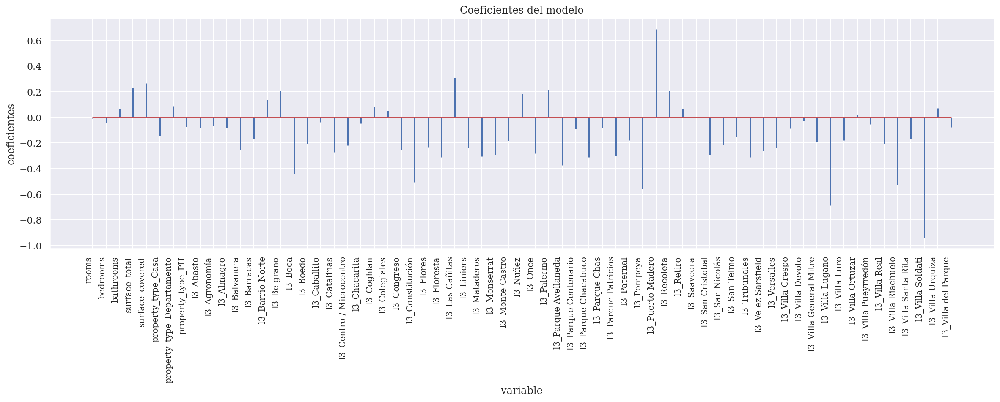

In [88]:
# Coeficientes del modelo
# ==============================================================================
df_coeficientes = pd.DataFrame(
                        {'predictor': X_train.columns,
                         'coef': modelo.coef_.flatten()}
                  )
rc('text', usetex=False)
fig, ax = plt.subplots(figsize=(20, 5))
ax.stem(df_coeficientes.predictor, df_coeficientes.coef, markerfmt=' ')
plt.xticks(rotation=90, ha='right', size=10)
ax.set_xlabel('variable')
ax.set_ylabel('coeficientes')
ax.set_title('Coeficientes del modelo');
rc('text', usetex=True)

En este caso vemos un cambio significante en el comportamiento de los coeficiente: una regularización de los mismos. Observe, primero, que el nivel de significancia se a distribuido a todos los predictores, segundo, que el predictor con mayor relevancia es puerto madero, y sabemos del proyecto 1 [ver aqui](https://jdrincone.github.io/Portafolio/post/proyect-2/) que es el barrio más costoso. Por otro lado, vemos que ningún predictor es cero y esto es lo que hace Ridge: **Reducir de forma proporcional el valor de todos los coeficientes del modelo pero sin que estos lleguen a cero**. Ahora pasaremos a la regulación por Lasso.

 <a id="s-312"></a>
 ## Regularización Lasso
 La regularización Lasso penaliza la suma del valor absolutos de los coeficientes de regresión  $||\beta||_1 = \sum_j^p|\beta_j|$. Tiene el efecto de forzar a que los coeficientes de los predictores tiendan a cero. Dado que un predictor con coeficiente de regresión cero no influye en el modelo, lasso consigue excluir los predictores menos relevantes. Al igual que en ridge, el grado de penalización está controlado por el hiperparámetro $\alpha$. Si $\alpha=0$ , el resultado es equivalente al de un modelo lineal por mínimos cuadrados ordinarios. A medida que $\alpha$ aumenta, mayor es la penalización y más predictores quedan excluidos.

 <a id="s-312a"></a>
### Optimización de hiperparámetro alphas  con LassoCV

In [89]:
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
# Creación y entrenamiento del modelo (con búsqueda por CV del valor óptimo alpha)
# ==============================================================================
# Por defecto LassoCV utiliza el mean squared error
modelo = LassoCV(
            alphas          = np.logspace(-10, 3, 200),
            normalize       = True,
            cv              = 10
         )
_ = modelo.fit(X = X_train, y = y_train)

Cuando se utiliza regularización, es útil evaluar cómo se aproximan a cero los coeficientes a medida que se incrementa el valor de alpha así como la evolución del error de validación cruzada en función del alpha empleado.

Tenga presente que el tiempo de ejecución fue de 264.0856 seguntos


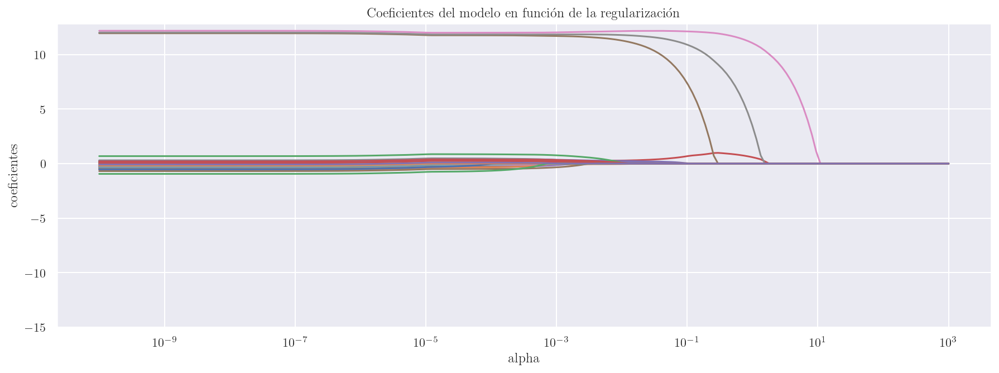

In [90]:
# Evolución de los coeficientes en función de alpha
# ==============================================================================
alphas = modelo.alphas_
coefs = []
tiempo_inicial = time() 


for alpha in alphas:
    modelo_temp = Lasso(alpha=alpha, fit_intercept=False, normalize=True)
    modelo_temp.fit(X_train, y_train)
    coefs.append(modelo_temp.coef_.flatten())

fig, ax = plt.subplots(figsize=(15, 5))
ax.plot(alphas, coefs)
ax.set_xscale('log')
ax.set_ylim([-15,None])
ax.set_xlabel('alpha')
ax.set_ylabel('coeficientes')
ax.set_title('Coeficientes del modelo en función de la regularización');
tiempo_final = time() 
tiempo_ejecucion = tiempo_final - tiempo_inicial
print (f'Tenga presente que el tiempo de ejecución fue de {tiempo_ejecucion:0.4f} seguntos')

Puede verse como que a medida que aumenta el valor de alpha, la regularización es mayor y más predictores quedan excluidos, es decir el valor tiende a cero.

Tenga presente que el tiempo de ejecución fue de 262.7176 seguntos


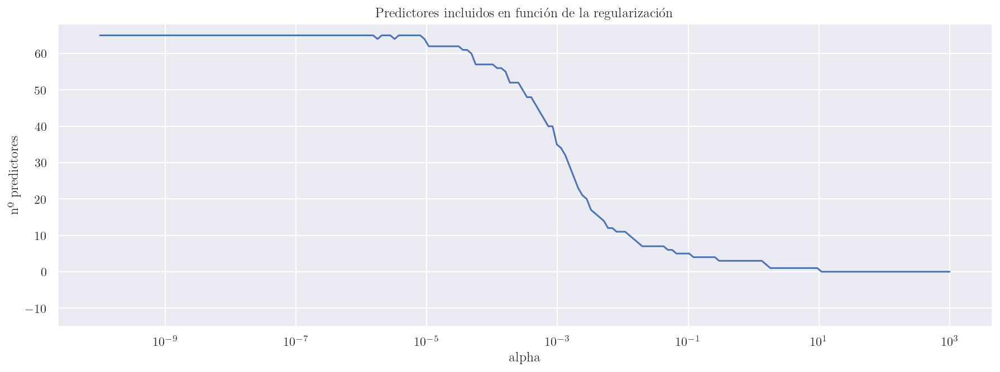

In [91]:
# Número de predictores incluidos (coeficiente !=0) en función de alpha
# ==============================================================================
alphas = modelo.alphas_
n_predictores = []
tiempo_inicial = time() 
for alpha in alphas:
    modelo_temp = Lasso(alpha=alpha, fit_intercept=False, normalize=True)
    modelo_temp.fit(X_train, y_train)
    coef_no_cero = np.sum(modelo_temp.coef_.flatten() != 0)
    n_predictores.append(coef_no_cero)

fig, ax = plt.subplots(figsize=(15, 5))
ax.plot(alphas, n_predictores)
ax.set_xscale('log')
ax.set_ylim([-15,None])
ax.set_xlabel('alpha')
ax.set_ylabel('nº predictores')
ax.set_title('Predictores incluidos en función de la regularización');
tiempo_final = time() 
tiempo_ejecucion = tiempo_final - tiempo_inicial
print (f'Tenga presente que el tiempo de ejecución fue de {tiempo_ejecucion:0.4f} seguntos')

Iniciamos con 65 predictores (dimensión de **X**) y a medida que aumenta alpha, dicho número se va reduciendo. Esta gráfica nos otorga mucha información, como cual es el alpha mínimo para obtener el número máximo de predictores y con ello las mismas métricas que el modelo anterior. También una gráfica interesante de realizar es como cambia el error en función del número de predictores que a su vez es función del hiperparámetro alpha, pero en este momento no se me ocurre, **sí el revisor podría instruime seria de gran ayuda.**

In [92]:
# Mejor valor alpha encontrado
# ==============================================================================
print(f"Mejor valor de alpha encontrado: {modelo.alpha_}")

Mejor valor de alpha encontrado: 3.9171014908092607e-07


In [93]:
#tomaremos como hiperparámetro, no el mejor (el lector puede hacer la prueba con el mejor, si no el
#que reduce a la mitad el número de predictores)
lasso = Lasso(alpha=10e-05)
lasso.fit(X_train, y_train)
y_test_pred = lasso.predict(X_test)
y_train_pred = lasso.predict(X_train)
residuo = (y_test_pred-y_test)
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2 = r2_score(y_test, y_test_pred)


-----------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Train: 0.235
                             Raíz del error cuadrático medio en Test: 0.237
                             Coeficiente de Determinación por r2_score: 0.848
-----------------------------------------------------------------------------------------------


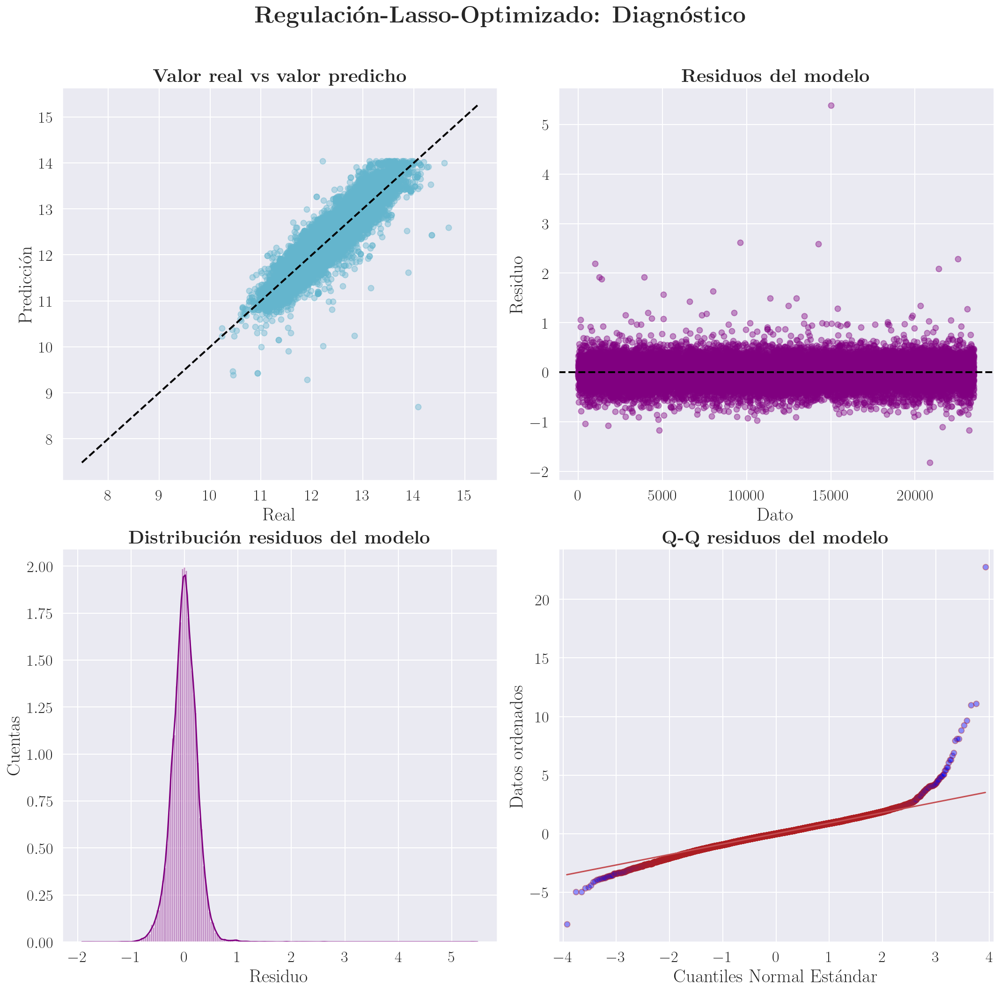

In [94]:
grafica_diagnostico(y_test_pred,residuo,rmse_train,rmse_test,r2,r'\textbf{Regulación-Lasso-Optimizado: }')

En este caso tenemos la misma conclusión dada en el modelo de Ridge sin optimización. Por último observemos como la regularización cambia el comportamiento de los coeficientes.

<a id="s-3raciertos5"></a>
## Aciertos y Desaciertos

In [95]:
aciertos_modelo(residuo, cota = 0.0001)

-----------------------------------------------
Tipos de propiedad que mejor predice el modelo
-----------------------------------------------
              property_type
Departamento              3
-----------------------------------
Top 10 de los Barrios que mejor predice el modelo
-----------------------------------
               l3
Villa Urquiza   1
Once            1
Barrio Norte    1
--------------------------------------------------------------------------------
                      Subconjunto de datos mejor predicho
--------------------------------------------------------------------------------


,rooms,bedrooms,bathrooms,property_type,l3,surface_total,surface_covered,price
33805,4.0,3.0,1.0,Departamento,Barrio Norte,4.532599,4.532599,12.468437
34878,2.0,1.0,1.0,Departamento,Villa Urquiza,3.871201,3.761200,11.849398
38480,3.0,2.0,1.0,Departamento,Once,4.043051,3.912023,11.608236


In [96]:
desaciertos_modelo(residuo, cota = 2.5)

----------------------------------------------
Tipos de propiedad que peor predice el modelo
----------------------------------------------
              property_type
Departamento              3
-----------------------------------
Barrios que peor predice el modelo
-----------------------------------
               l3
Puerto Madero   1
Almagro         1
Recoleta        1
--------------------------------------------------------------------------------
                      Subconjunto de datos peor predicho
--------------------------------------------------------------------------------


,rooms,bedrooms,bathrooms,property_type,l3,surface_total,surface_covered,price
1543,3.0,2.0,1.0,Departamento,Almagro,4.094345,4.094345,9.287301
56259,4.0,3.0,3.0,Departamento,Recoleta,4.700480,4.634729,10.239960
63053,3.0,2.0,3.0,Departamento,Puerto Madero,5.616771,5.393628,8.699515


<a id="s-312b"></a>
### Importancia predictores

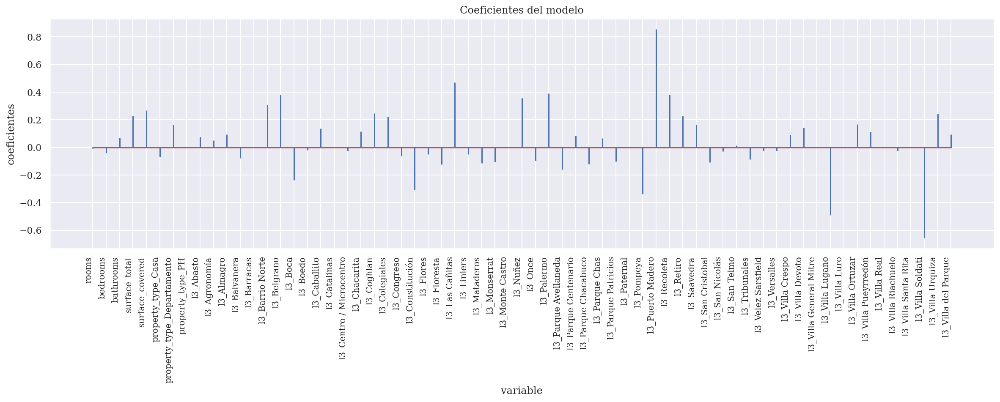

In [97]:
# Coeficientes del modelo
# ==============================================================================
df_coeficientes = pd.DataFrame(
                        {'predictor': X_train.columns,
                         'coef': lasso.coef_.flatten()}
                  )
rc('text', usetex=False)
fig, ax = plt.subplots(figsize=(20, 5))
ax.stem(df_coeficientes.predictor, df_coeficientes.coef, markerfmt=' ')
plt.xticks(rotation=90, ha='right', size=10)
ax.set_xlabel('variable')
ax.set_ylabel('coeficientes')
ax.set_title('Coeficientes del modelo');
rc('text', usetex=True)

En este caso, y como es de esperar se han reducido a cero los coeficientes que tenian menor peso encontrados con Ridge, es decir nuestro modelo esta funcionando de forma adecuada.

 <a id="s-32"></a>
#  Xgboost

In [98]:
import xgboost as xgb
from xgboost import XGBRegressor

from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
import statsmodels.api as sm


In [99]:
xgb_reg = XGBRegressor(objective = 'reg:squarederror')
xgb_reg.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [100]:
#Cross Validation ##Ver cv a elegir
xgb_score_train = abs(cross_val_score(xgb_reg , X_train, y_train, cv=5,
                               scoring = 'neg_root_mean_squared_error'))
print('RMSE train:%0.2f (+/- %0.2f)'% (xgb_score_train .mean(),xgb_score_train .std()))
xgb_score_test = abs(cross_val_score(xgb_reg , X_test , y_test, cv=5,
                               scoring='neg_root_mean_squared_error'))
print('RMSE test:%0.2f (+/- %0.2f)'% (xgb_score_test.mean(),xgb_score_test.std()))

RMSE train:0.21 (+/- 0.00)
RMSE test:0.21 (+/- 0.01)


In [101]:
y_train_pred = xgb_reg.predict(X_train)
y_test_pred = xgb_reg.predict(X_test)
residuo = y_test - y_test_pred 
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2 = r2_score(y_test, y_test_pred)


-----------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Train: 0.191
                             Raíz del error cuadrático medio en Test: 0.209
                             Coeficiente de Determinación por r2_score: 0.882
-----------------------------------------------------------------------------------------------


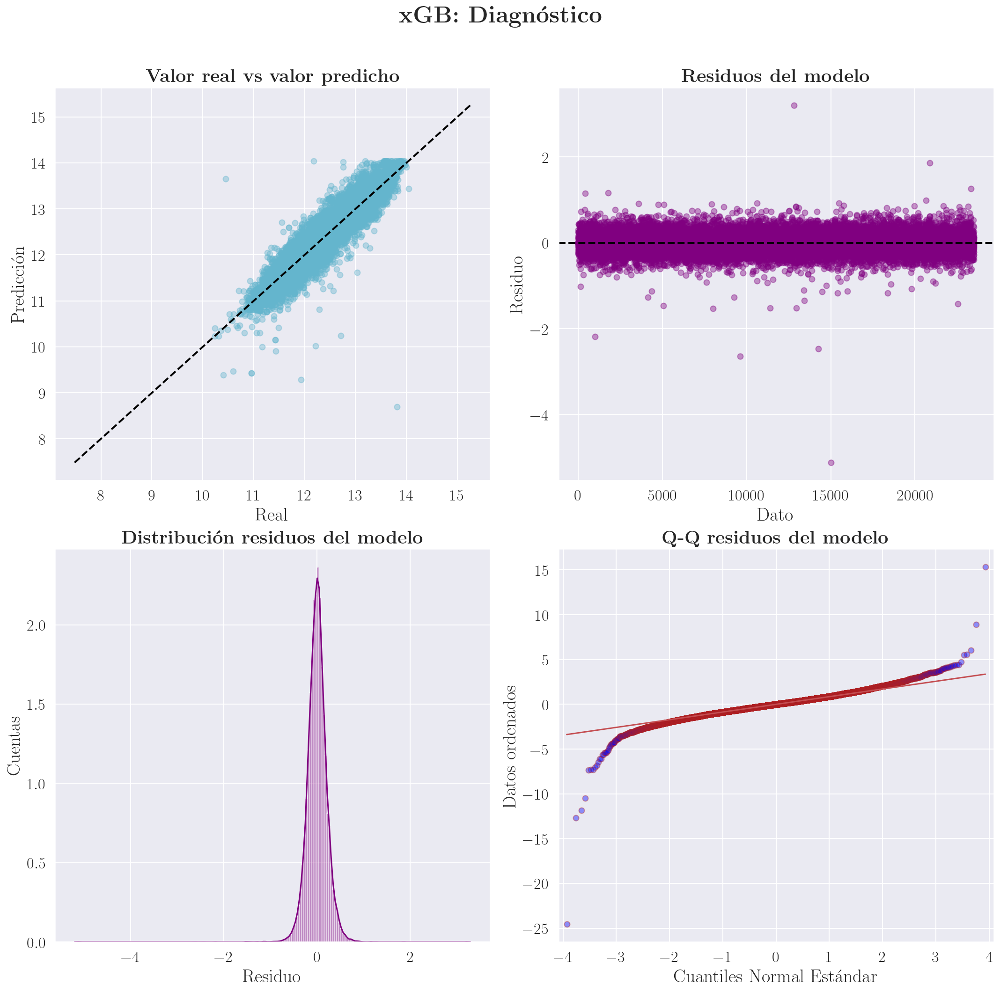

In [102]:
grafica_diagnostico(y_test_pred,residuo,rmse_train,rmse_test,r2, r'\textbf{xGB: }')

Las métricas evaluadas nos indican que las predicciones del modelo simple por arboles se alejan en promedio 0.20 unidades del valor real (RMSE). Recuerde que estamos usando datos transformados por log. En adición, el modelos performace correctamente un 88 % de las observaciones del conjunto de test (**$R^2$**). Nuevamente los valores atípicos degeneran el performance del modelo, pero en este caso con la regulación de coeficientes, el modelo  aumento su espacio de predición: funciona bien cuando los resudios estan entre los cuartiles [-3,3] si se comparan con una distribución teórica que sigue una normal (interpretación de la gráfica q-q plot).

 <a id="s-321"></a>
### Optimización hiperparámetros con RandomizedSearchCV

Para realizar la optimización usaremos *RandomizedSearchCv* tomando como hiperparámetros a mejorar lso siguientes:

In [103]:
tiempo_inicial = time() 

param_grid = {'nthread': [4],
              'objective': ['reg:squarederror'],
              'learning_rate':[0.01, 0.1],
              'max_depth':[4,5,6],
              'min_child_weight': [1,2],
              'subsample':[0.5,0.7,1],
              'colsample_bytree':[0.7,1],
              'reg_lambda':[1,2,3],
              'n_estimators':[10, 100,1000, 5000]} 
xgb_reg = XGBRegressor()
rs = RandomizedSearchCV(xgb_reg, param_grid, scoring='neg_root_mean_squared_error', cv=5,random_state=2021)
rs.fit(X_train,y_train)
tiempo_final = time() 
tiempo_ejecucion = tiempo_final - tiempo_inicial
print (f'Tenga presente que el tiempo de ejecución fue de {tiempo_ejecucion:0.4f} seguntos')

Tenga presente que el tiempo de ejecución fue de 2302.7391 seguntos


In [104]:
rs.best_params_

{'subsample': 0.7,
 'reg_lambda': 1,
 'objective': 'reg:squarederror',
 'nthread': 4,
 'n_estimators': 5000,
 'min_child_weight': 1,
 'max_depth': 5,
 'learning_rate': 0.1,
 'colsample_bytree': 1}

In [115]:
xgb_reg = XGBRegressor(colsample_bytree= 1,
                       learning_rate= 0.1,
                       max_depth= 5,
                       min_child_weight=4,
                       n_estimators= 5000,
                       nthread= 4,
                       objective= 'reg:squarederror',
                       reg_lambda= 1,
                       subsample= 0.7)
xgb_reg.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1, max_delta_step=0, max_depth=5,
             min_child_weight=4, missing=nan, monotone_constraints='()',
             n_estimators=5000, n_jobs=4, nthread=4, num_parallel_tree=1,
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             subsample=0.7, tree_method='exact', validate_parameters=1,
             verbosity=None)

In [116]:
y_train_pred = xgb_reg.predict(X_train)
y_test_pred = xgb_reg.predict(X_test)
residuo = y_test - y_test_pred 
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2 = r2_score(y_test, y_test_pred)

-----------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Train: 0.138
                             Raíz del error cuadrático medio en Test: 0.188
                             Coeficiente de Determinación por r2_score: 0.904
-----------------------------------------------------------------------------------------------


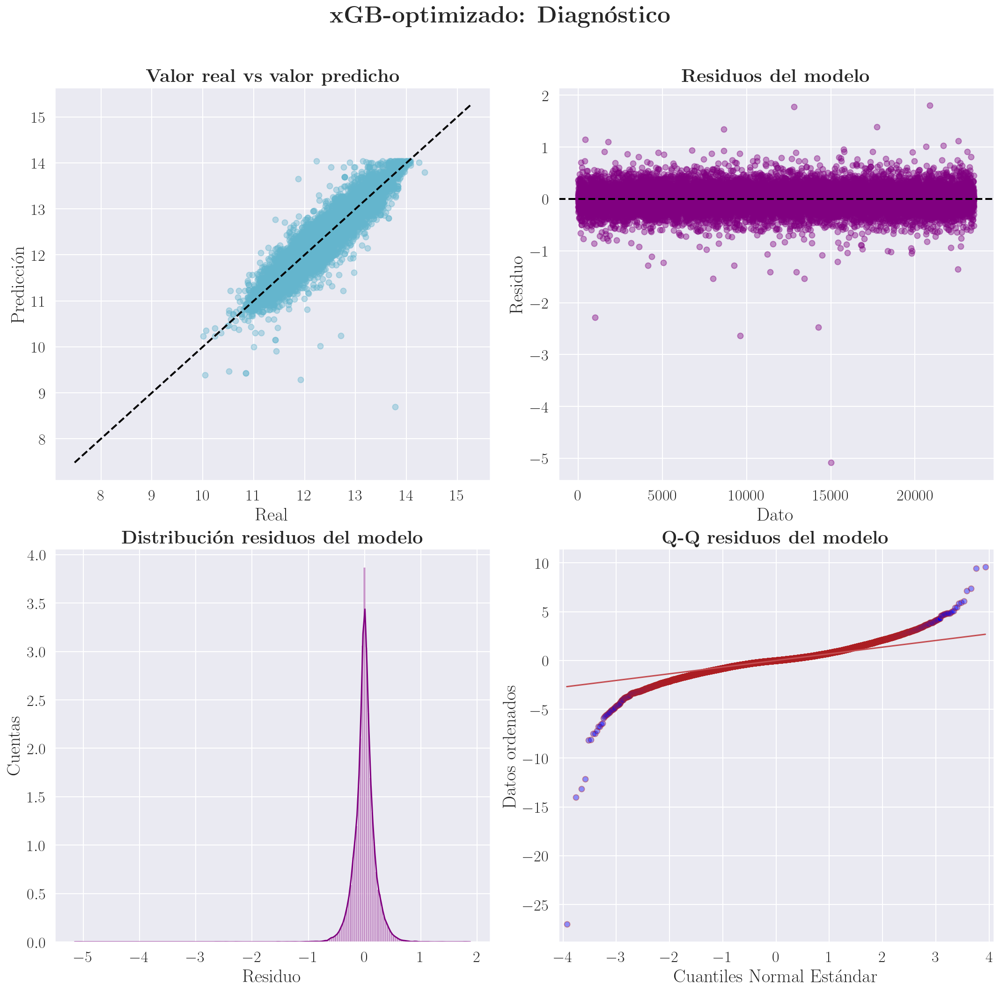

In [117]:
grafica_diagnostico(y_test_pred,residuo,rmse_train,rmse_test,r2, r'\textbf{xGB-optimizado: }')

Las métricas evaluadas nos indican que las predicciones del modelo simple por arboles se alejan en promedio 0.18 unidades del valor real (RMSE). Recuerde que estamos usando datos transformados por log. En adición, el modelos performace correctamente un 90 % de las observaciones del conjunto de test (**$R^2$**). Nuevamente los valores atípicos degeneran el performance del modelo, pero en este caso con la regulación de coeficientes, el modelo  aumento su espacio de predición: funciona bien cuando los resudios estan entre los cuartiles [-3,3] si se comparan con una distribución teórica que sigue una normal (interpretación de la gráfica q-q plot).

<a id="s-3raciertos6"></a>
## Aciertos y Desaciertos

In [118]:
aciertos_modelo(residuo, cota = 0.0001)

-----------------------------------------------
Tipos de propiedad que mejor predice el modelo
-----------------------------------------------
              property_type
Departamento             16
PH                        1
-----------------------------------
Top 10 de los Barrios que mejor predice el modelo
-----------------------------------
               l3
Colegiales      5
Balvanera       3
Almagro         2
Puerto Madero   2
Belgrano        1
Boedo           1
Caballito       1
Recoleta        1
Nuñez           1
--------------------------------------------------------------------------------
                      Subconjunto de datos mejor predicho
--------------------------------------------------------------------------------


,rooms,bedrooms,bathrooms,property_type,l3,surface_total,surface_covered,price
61400,2.0,1.0,1.0,Departamento,Colegiales,4.094345,3.988984,11.941456
20266,4.0,3.0,4.0,Departamento,Puerto Madero,5.135798,5.135798,13.795308
74724,2.0,1.0,2.0,Departamento,Puerto Madero,4.882802,4.356709,13.017003
10522,4.0,3.0,3.0,Departamento,Recoleta,4.753590,4.700480,12.736701
69537,2.0,1.0,1.0,Departamento,Colegiales,4.094345,3.988984,11.941456
20742,4.0,3.0,2.0,Departamento,Belgrano,5.099866,4.983607,13.262125
17450,2.0,1.0,1.0,Departamento,Colegiales,4.094345,3.988984,11.941456
13412,3.0,2.0,1.0,PH,Boedo,4.248495,4.248495,11.842229
16757,2.0,1.0,1.0,Departamento,Balvanera,3.688879,3.688879,11.385092
17973,3.0,3.0,2.0,Departamento,Almagro,4.382027,4.317488,12.072541


In [109]:
desaciertos_modelo(residuo, cota = 2.5)

----------------------------------------------
Tipos de propiedad que peor predice el modelo
----------------------------------------------
              property_type
Departamento              2
-----------------------------------
Barrios que peor predice el modelo
-----------------------------------
               l3
Almagro         1
Puerto Madero   1
--------------------------------------------------------------------------------
                      Subconjunto de datos peor predicho
--------------------------------------------------------------------------------


,rooms,bedrooms,bathrooms,property_type,l3,surface_total,surface_covered,price
1543,3.0,2.0,1.0,Departamento,Almagro,4.094345,4.094345,9.287301
63053,3.0,2.0,3.0,Departamento,Puerto Madero,5.616771,5.393628,8.699515


 <a id="s-322"></a>
### Importancia de predictores


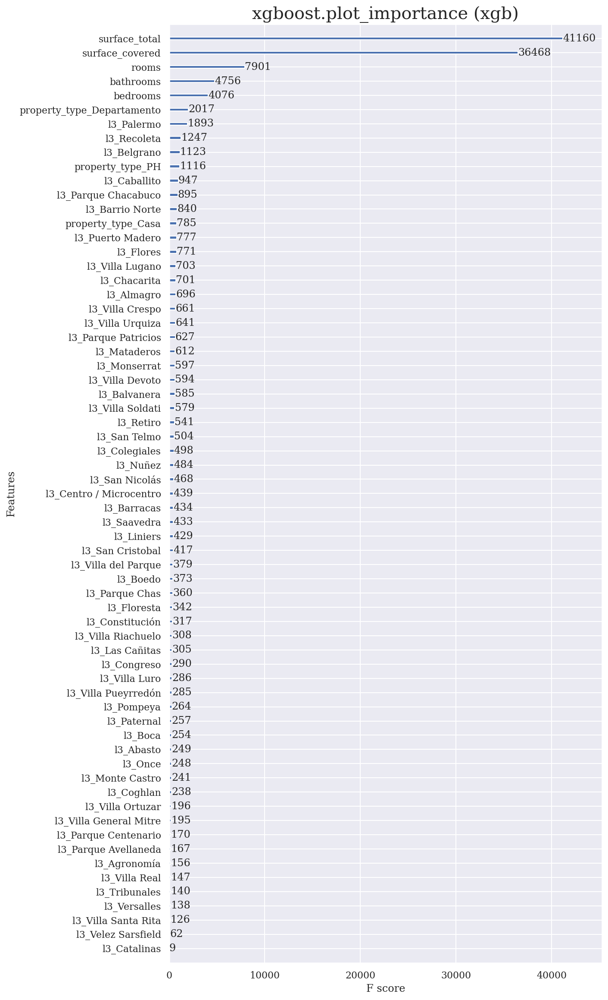

si la gráfica te sale fuera de escala, volver a cargar esta celda y mejorara la gráfica


In [120]:
rc('text', usetex=False)
xgb.plot_importance(xgb_reg)
plt.rcParams['figure.figsize'] = [9,20]
plt . title ( "xgboost.plot_importance (xgb)",size=20 ) 
plt.show()
rc('text', usetex= True)
print('si la gráfica te sale fuera de escala, volver a cargar esta celda y mejorara la gráfica')

En este caso, xgboost da más importancia a las variables númericas en orden de correlación que las variables categoricas.

 <a id="s-33"></a>
# Random Forest

Un modelo Random Forest está formado por un conjunto de árboles de decisión individuales, cada uno entrenado con una muestra ligeramente distinta de los datos de entrenamiento generada mediante bootstrapping. La predicción de una nueva observación se obtiene agregando las predicciones de todos los árboles individuales que forman el modelo.

El modelo se iniciará utilizando 10 árboles (*n_estimators=10*) y manteniendo el resto de hiperparámetros con su valor por defecto. Al ser hiperparámetros, no se puede saber de antemano cuál es el valor más adecuado, la forma de identificarlos es mediante el uso de estrategias de validación, que posteriormente realizaremos.

In [121]:
from sklearn.ensemble import RandomForestRegressor
rc('text', usetex=False)
# Creación del modelo
# ==============================================================================
modelo = RandomForestRegressor(
            n_estimators = 10,
            criterion    = 'mse',
            max_depth    = None,
            max_features = 'auto',
            oob_score    = False,
            n_jobs       = -1,
            random_state = 2021
         )

# Entrenamiento del modelo
# ==============================================================================
modelo.fit(X_train, y_train)

RandomForestRegressor(n_estimators=10, n_jobs=-1, random_state=2021)

In [122]:
y_train_pred = modelo.predict(X_train)
y_test_pred = modelo.predict(X_test)
residuo = y_test - y_test_pred 
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2 = r2_score(y_test, y_test_pred)


-----------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Train: 0.106
                             Raíz del error cuadrático medio en Test: 0.187
                             Coeficiente de Determinación por r2_score: 0.905
-----------------------------------------------------------------------------------------------


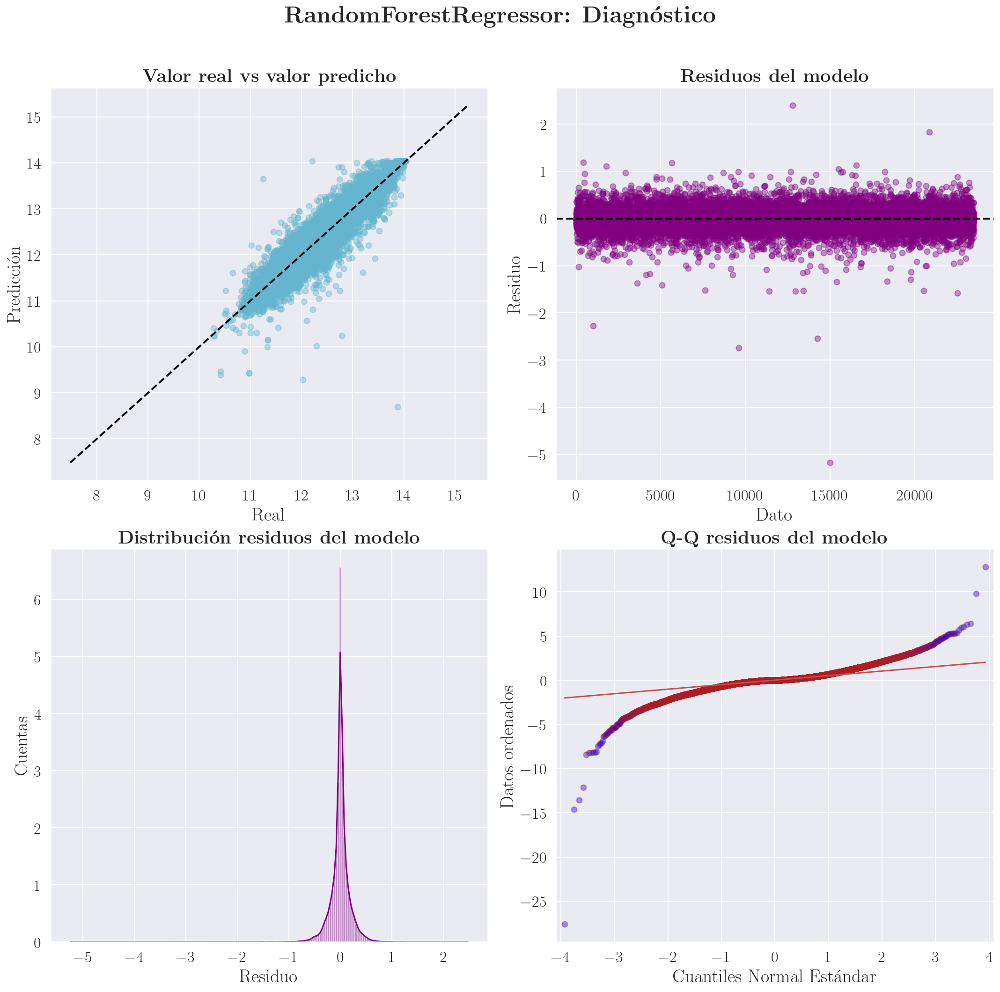

In [123]:
rc('text', usetex=True)
grafica_diagnostico(y_test_pred,residuo,rmse_train,rmse_test,r2, r'\textbf{RandomForestRegressor: }')

Las métricas evaluadas nos indican que las predicciones del modelo simple por arboles se alejan en promedio 0.18 unidades del valor real (RMSE). Recuerde que estamos usando datos transformados por log. En adición, el modelos performace correctamente un 90 % de las observaciones del conjunto de test (**$R^2$**). Nuevamente los valores atípicos degeneran el performance del modelo, pero en este caso con la regulación de coeficientes, el modelo  aumento su espacio de predición: funciona bien cuando los resudios estan entre los cuartiles [-2,2] si se comparan con una distribución teórica que sigue una normal (interpretación de la gráfica q-q plot).

 <a id="s-331"></a>
## Optimización hiperparámetros con RandomizedSearchCV

In [124]:
from sklearn.model_selection import RepeatedKFold
tiempo_inicial = time() 
#Grid de hiperparámetros evaluados
# ==============================================================================
param_grid = {'n_estimators': [50,500],
              'max_features': [5, 7, 9],
              'max_depth'   : [None, 3, 10, 20]
             }

# Búsqueda por grid search con validación cruzada
# ==============================================================================
grid = GridSearchCV(
        estimator  = RandomForestRegressor(random_state = 2021),
        param_grid = param_grid,
        scoring    = 'neg_root_mean_squared_error',
        n_jobs     = - 1,
        cv         = RepeatedKFold(n_splits=5, n_repeats=3, random_state=2021), 
        refit      = True,
        verbose    = 0,
        return_train_score = True
       )

grid.fit(X = X_train, y = y_train)

# Resultados
# ==============================================================================
resultados = pd.DataFrame(grid.cv_results_)
resultados.filter(regex = '(param.*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(4)

tiempo_final = time() 
tiempo_ejecucion = tiempo_final - tiempo_inicial
print (f'Tenga presente que el tiempo de ejecución fue de {tiempo_ejecucion:0.4f} seguntos')

Tenga presente que el tiempo de ejecución fue de 1349.8503 seguntos


In [125]:
# Mejores hiperparámetros por validación cruzada
# ==============================================================================
print("----------------------------------------")
print("Mejores hiperparámetros encontrados (cv)")
print("----------------------------------------")
print(grid.best_params_, ":", grid.best_score_, grid.scoring)

----------------------------------------
Mejores hiperparámetros encontrados (cv)
----------------------------------------
{'max_depth': None, 'max_features': 5, 'n_estimators': 50} : -0.1837383402249044 neg_root_mean_squared_error


Una vez identificados los mejores hiperparámetros, se reentrena el modelo indicando los valores óptimos en sus argumentos. Si en el **GridSearchCV()** se indica **refit=True**, este reentrenamiento se hace automáticamente y el modelo resultante se encuentra almacenado en **.best_estimator_**

In [126]:
# Error de test del modelo final
# ==============================================================================
modelo_final = grid.best_estimator_
y_train_pred = modelo_final.predict(X_train)
y_test_pred = modelo_final.predict(X_test)
residuo = y_test - y_test_pred 
rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2 = r2_score(y_test, y_test_pred)

-----------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Train: 0.100
                             Raíz del error cuadrático medio en Test: 0.177
                             Coeficiente de Determinación por r2_score: 0.915
-----------------------------------------------------------------------------------------------


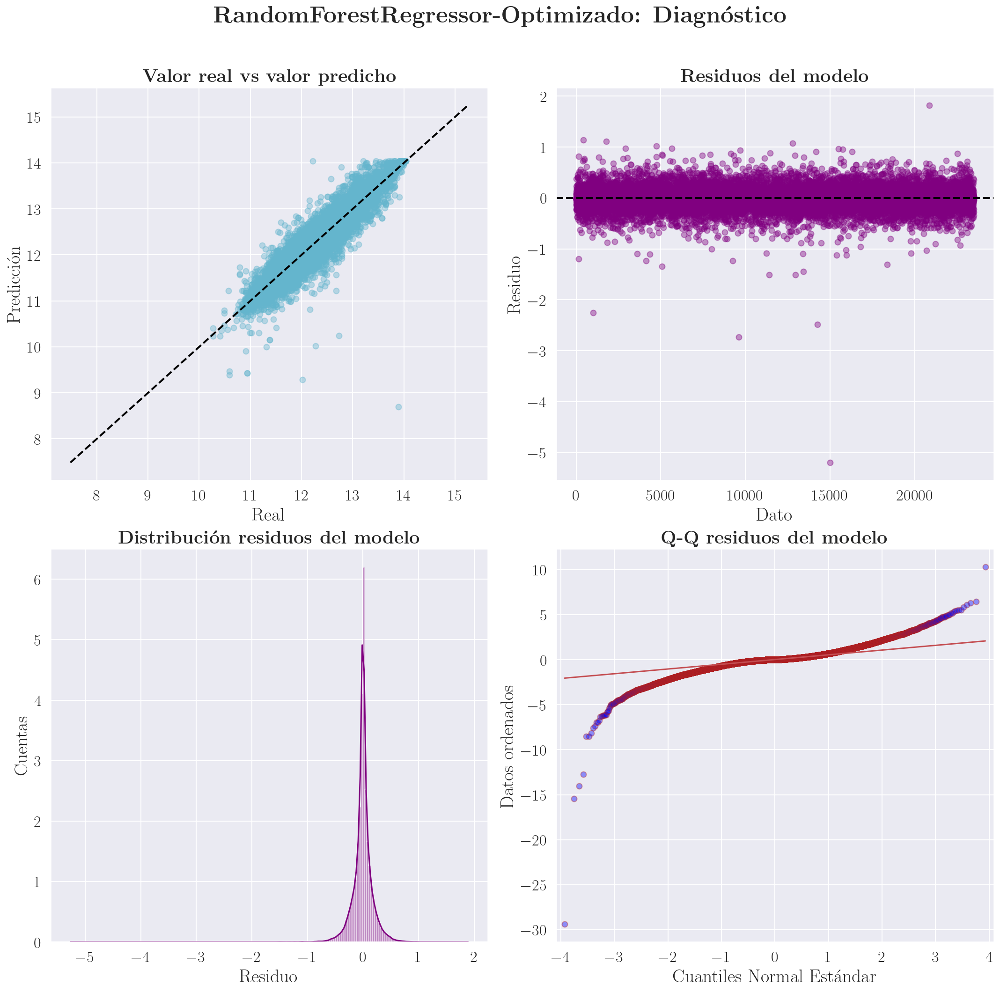

In [127]:
grafica_diagnostico(y_test_pred,residuo,rmse_train,rmse_test,r2, r'\textbf{RandomForestRegressor-Optimizado: }')

Las métricas evaluadas nos indican que las predicciones del modelo simple por arboles se alejan en promedio 0.17 unidades del valor real (RMSE). Recuerde que estamos usando datos transformados por log. En adición, el modelos performace correctamente un 91 % de las observaciones del conjunto de test (**$R^2$**). Nuevamente los valores atípicos degeneran el performance del modelo, pero en este caso con la regulación de coeficientes, el modelo  aumento su espacio de predición: funciona bien cuando los resudios estan entre los cuartiles [-2,2] si se comparan con una distribución teórica que sigue una normal (interpretación de la gráfica q-q plot).

<a id="s-3raciertos7"></a>
## Aciertos y Desaciertos

In [128]:
aciertos_modelo(residuo, cota = 0.0001)

-----------------------------------------------
Tipos de propiedad que mejor predice el modelo
-----------------------------------------------
              property_type
Departamento           1092
PH                      242
Casa                      3
-----------------------------------
Top 10 de los Barrios que mejor predice el modelo
-----------------------------------
                    l3
Almagro            297
Palermo            239
Villa Crespo       221
Parque Centenario  105
Barrio Norte        79
Caballito           48
Balvanera           44
Belgrano            41
Once                36
Puerto Madero       34
--------------------------------------------------------------------------------
                      Subconjunto de datos mejor predicho
--------------------------------------------------------------------------------


,rooms,bedrooms,bathrooms,property_type,l3,surface_total,surface_covered,price
16346,2.0,1.0,1.0,Departamento,Almagro,4.234107,4.174387,11.951180
64870,4.0,3.0,2.0,Departamento,Palermo,4.290459,4.189655,12.409013
24924,4.0,3.0,3.0,Departamento,Palermo,4.836282,4.787492,13.579788
12519,4.0,3.0,2.0,Departamento,Palermo,4.812184,4.744932,12.847400
40255,2.0,1.0,1.0,Departamento,Villa Crespo,4.143135,4.094345,11.736069
...,...,...,...,...,...,...,...,...
29452,4.0,3.0,2.0,Departamento,Barrio Norte,4.595120,4.553877,12.345835
62076,3.0,2.0,2.0,Departamento,Villa Crespo,4.343805,4.204693,12.369466
53033,2.0,1.0,1.0,Departamento,Balvanera,4.077537,3.663562,11.608236
16051,7.0,6.0,2.0,PH,Villa Crespo,5.857933,5.857933,13.500800


In [129]:
desaciertos_modelo(residuo, cota = 2.5)

----------------------------------------------
Tipos de propiedad que peor predice el modelo
----------------------------------------------
              property_type
Departamento              2
-----------------------------------
Barrios que peor predice el modelo
-----------------------------------
               l3
Almagro         1
Puerto Madero   1
--------------------------------------------------------------------------------
                      Subconjunto de datos peor predicho
--------------------------------------------------------------------------------


,rooms,bedrooms,bathrooms,property_type,l3,surface_total,surface_covered,price
1543,3.0,2.0,1.0,Departamento,Almagro,4.094345,4.094345,9.287301
63053,3.0,2.0,3.0,Departamento,Puerto Madero,5.616771,5.393628,8.699515


 <a id="s-332"></a>
### Importancia predictores

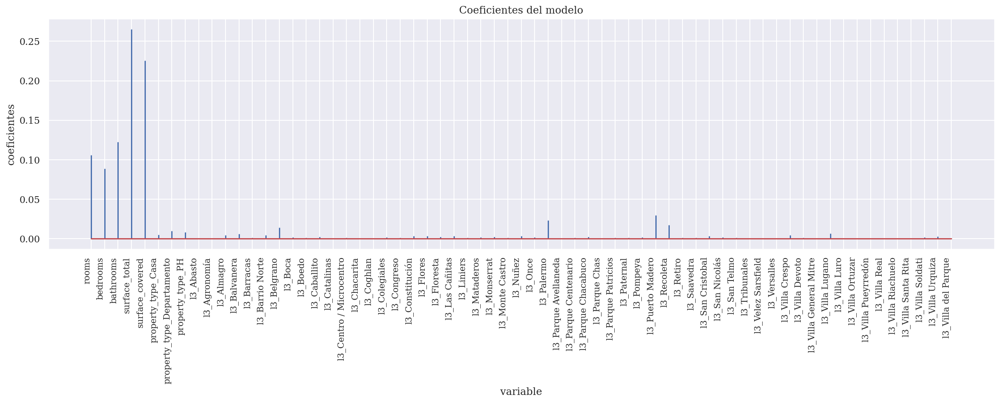

In [130]:
# Coeficientes del modelo
# ==============================================================================
df_coeficientes = pd.DataFrame(
                        {'predictor': X_train.columns,
                         'coef': modelo_final.feature_importances_.flatten()}
                  )
rc('text', usetex=False)
fig, ax = plt.subplots(figsize=(20, 5))
ax.stem(df_coeficientes.predictor, df_coeficientes.coef, markerfmt=' ')
plt.xticks(rotation=90, ha='right', size=10)
ax.set_xlabel('variable')
ax.set_ylabel('coeficientes')
ax.set_title('Coeficientes del modelo');
rc('text', usetex=True)

De igual manera, la importancia de los predictores cambia, en este caso siguen en mayor importancia superficie total, cubierta y los bathrooms. Algo a destacar es que hay muchos features que son despresciados por el modelo. 

 <a id="s-4"></a>
# Comparación Modelos

Por último tenemos el resumen del performance de cada modelo, el cual se puede medir a partir de las métricas evaluadas.

In [131]:
error_modelos = pd.DataFrame({
                        'modelo': ['Benchmark', 'Tree', 'Knn', 'Ridge',
                                   'Lasso','Xgboots','RandomForest'],
                        'rmse': [0.236,0.220,0.202,0.235,0.237,0.188,0.176],
                        'r2': [0.848,0.869,0.889,0.848,0.848,0.904,0.916]
                     })


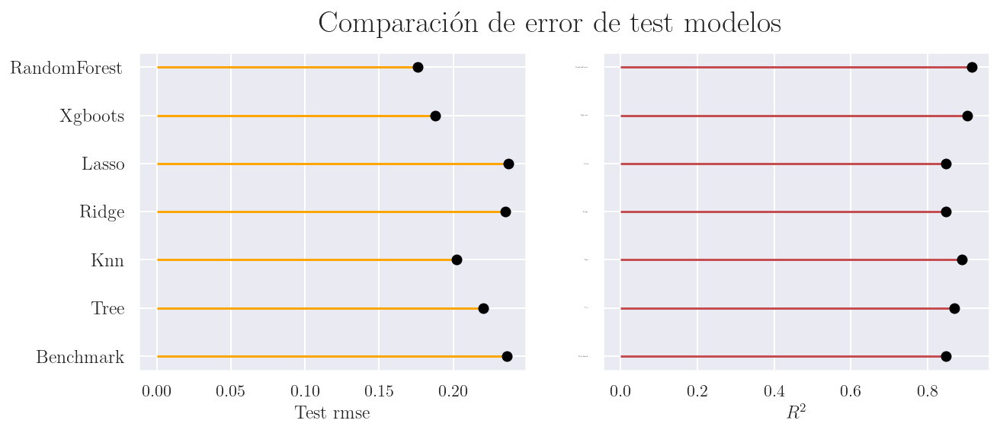

In [132]:
fig = plt.figure(figsize=(10, 3.84)) 
ax1 = plt.subplot(1,2,1) 
ax1.hlines(error_modelos.modelo, xmin=0, xmax=error_modelos.rmse, color ='orange')
ax1.plot(error_modelos.rmse, error_modelos.modelo, "o", color='black')
ax1.tick_params(axis='y', which='major', labelsize=12)
ax1.set_xlabel('Test rmse');

ax2 = plt.subplot(1,2,2)
ax2.hlines(error_modelos.modelo, xmin=0, xmax=error_modelos.r2,color='r')
ax2.plot(error_modelos.r2, error_modelos.modelo, "o", color='black')
ax2.tick_params(axis='y', which='major', labelsize=0)
ax2.set_xlabel('$R^2$');
fig.suptitle('Comparación de error de test modelos', fontsize = 20, fontweight = "bold");

 <a id="s-5"></a>
# Conclusiones

- En este punto vemos que tanto los modelos de regresión poseen un desempeño sobresaliente ($R^2>0.8$) cuando las variables continuas predictoras y a predecir son transformadas inicialmente con la función logaritmo para poseer una distribución lo más similar al conjunto de distribuciones exponenciales donde los algoritmos de machine learning funcionan mejor.

- Vemos que el filtro inicial de los $3\sigma$ nos permite obtener obtener un 98.3% del conjunto de datos original, lo cual permite que la muestra de trabajo sea lo más similar a la población total de los datos. Esto contiene en si mismo un inconveniente y es la existencia de datos outleirs que reducen la eficacia de los modelos cuando son evaluados por métricas como el rmse. Esta consecuencia se refleja en las gráficas q-q plot con las que diagnosticamos cada modelo. Dichas gráficas nos dan los intervalos intercuartilicos donde la distribución de los residuos es lo más similar a una distribución normal. Una solución al inconveniente de los outliers se dará en la parte de extra, donde de forma visual eliminaremos los datos que no deberían estar en la muestra.

- Es sorprendente que cada modelo posea una disposición diferente de los features de importancia y que con esto, al final todos los modelos posean un performance similar.

- Por otro lado no hemos analizado multicolinealidad en detalle, algo que puede mejor nuestros modelos, de igualmanera no hemos realizado un análisis sobre Heterocedasticidad que nos permita inferir una mejor función para transformar los datos, tampoco hemos análizado  **$𝑅^2_{𝑎𝑑𝑗𝑢𝑡𝑒𝑑}$**  que nos da mejor información en sistemas multivariables.

- Vemos que la función aciertos y desaciertos podemos obtener información donde mejor y peor se comporta cada modelo que hemos entrenado. En este punto no podemos dar una conclusión general, pues cada modelo posee una 'región' diferente donde funciona mejor, pero si podemos decir de forma general que en el barrio puerto madero, hay instancias que posiblemente sean valores atípicos, pues en todos los madelos siempre aparece dicho ítem en el DataFrame con peor predicción. Adicional dado que mayoritariamente las instancias son tipo departamento, entonces es más probable que estas posean un mejor performance.

 <a id="s-6"></a>
# Extra
## Deteción de outliers de forma gráfica

En esta sección eliminaremos aquellos datos outliers que aparecen en el train y test del modelo con mejor performance: RandomForest

-----------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Train: 0.100
                             Raíz del error cuadrático medio en Test: 0.177
                             Coeficiente de Determinación por r2_score: 0.915
-----------------------------------------------------------------------------------------------


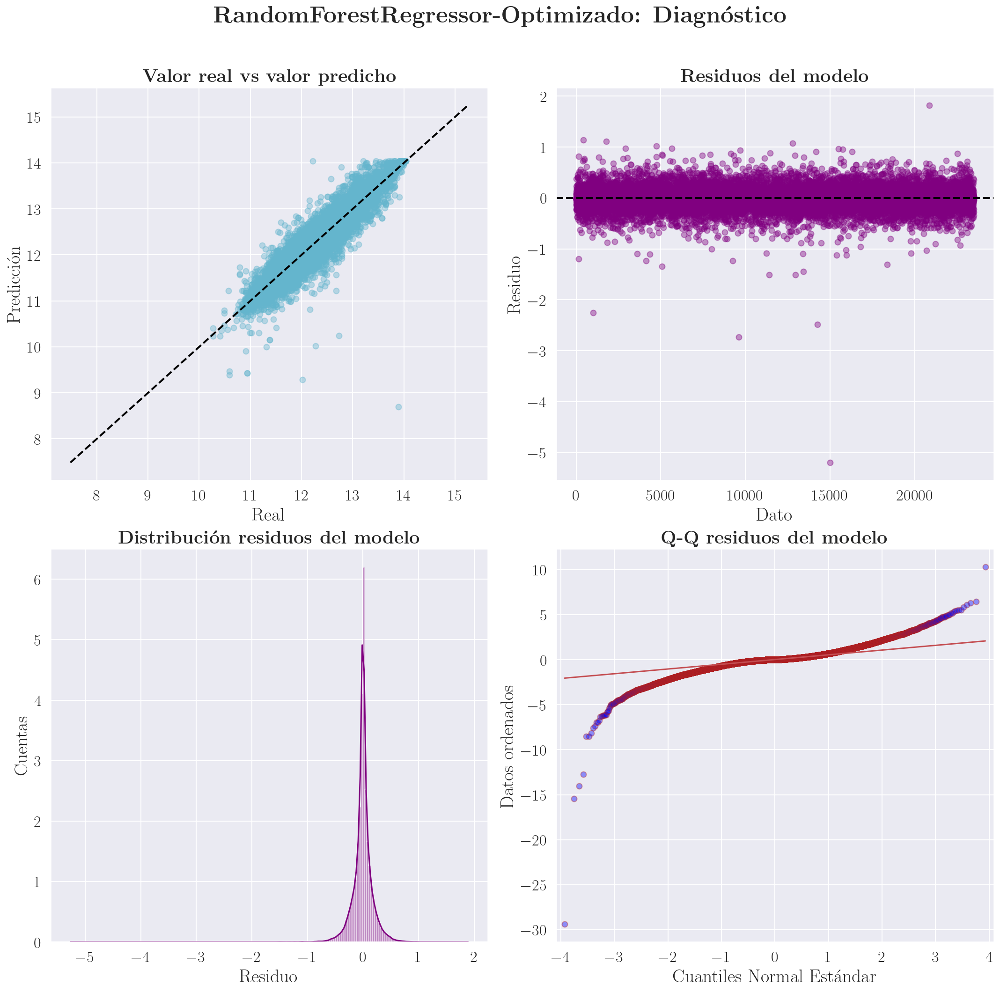

In [133]:
grafica_diagnostico(y_test_pred,residuo,rmse_train,rmse_test,r2, r'\textbf{RandomForestRegressor-Optimizado: }')

Implementación gráfica para entender el corte que se realizará,

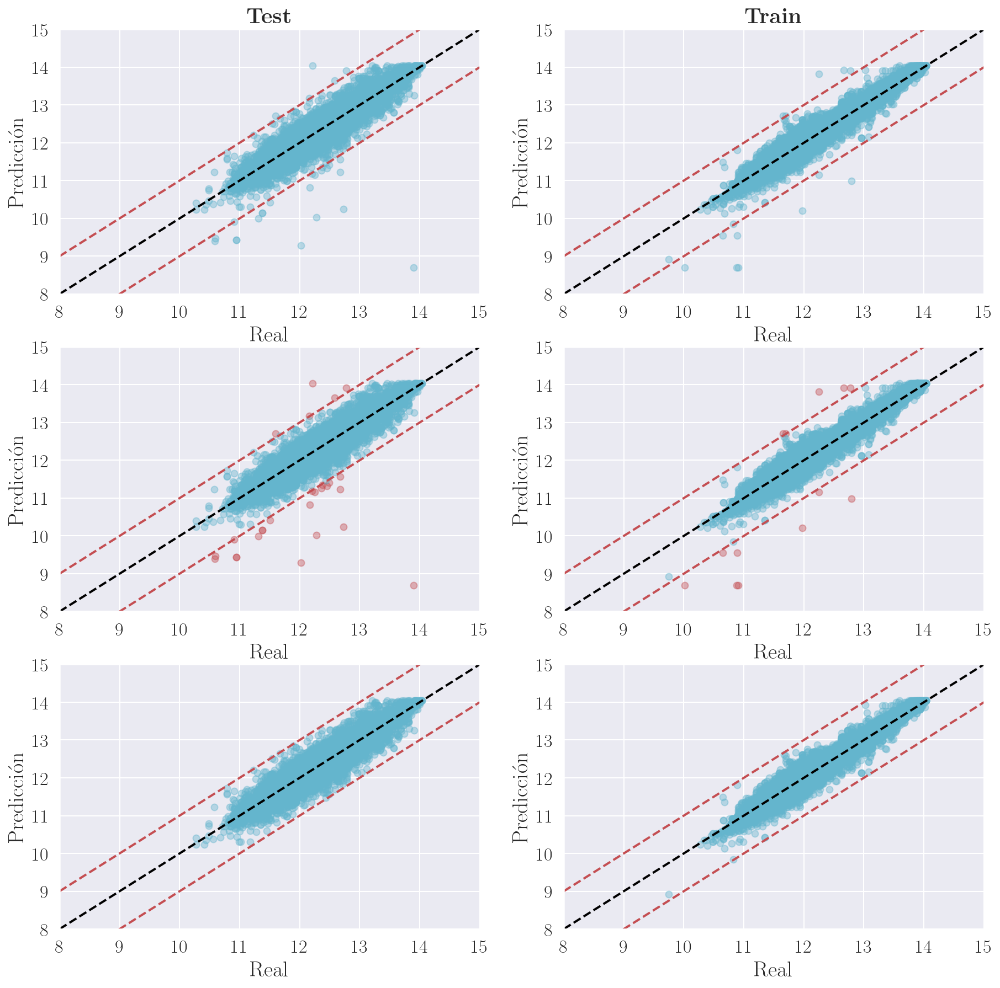

In [134]:
 fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))
    #linea y=x
y_test = np.array(y_test)
y_train = np.array(y_train)
xx = np.linspace(y_test.min()-0.1*y_test.mean(), y_test.max()+0.1*y_test.mean(),len(y_test))
yy = xx
yy1 =xx+1
yy2=xx-1
axes[0, 0].scatter(y_test_pred,y_test, c='c', alpha = 0.4)
axes[0, 0].plot(xx,yy,'k--', color = 'black', lw=2)
axes[0, 0].plot(xx,yy1,'k--', color = 'r', lw=2)
axes[0, 0].plot(xx,yy2,'k--', color = 'r', lw=2)
axes[0, 0].set_title(r'\textbf{Test}', fontsize = 20)
axes[0, 0].set_xlabel('Real',fontsize = 20)
axes[0, 0].set_ylabel('Predicción',fontsize = 20)
axes[0, 0].tick_params(labelsize = 17)
axes[0, 0].set_xlim(8,15)
axes[0, 0].set_ylim(8,15)
axes[0, 1].scatter(y_train_pred,y_train, c='c', alpha = 0.4)
axes[0, 1].plot(xx,yy,'k--', color = 'black', lw=2)
axes[0, 1].plot(xx,yy1,'k--', color = 'r', lw=2)
axes[0, 1].plot(xx,yy2,'k--', color = 'r', lw=2)
axes[0, 1].set_title(r'\textbf{Train}', fontsize = 20)
axes[0, 1].set_xlabel('Real',fontsize = 20)
axes[0, 1].set_ylabel('Predicción',fontsize = 20)
axes[0, 1].tick_params(labelsize = 17)
axes[0, 1].set_xlim(8,15)
axes[0, 1].set_ylim(8,15)
h1=1; #parametro que mide que tato deseo cortar los datos
h2 =1;#parametro que mide que tato deseo cortar los datos
#para test
yout_test_pred = np.zeros(len(y_test))
yout_test = np.zeros(len(y_test))
for i in range(0,len(y_test)):
    if((y_test_pred[i]>y_test[i]+h1) | (y_test_pred[i]<y_test[i]-h1)):
        yout_test_pred[i]=y_test_pred[i]
        yout_test[i]=y_test[i]
        
#para train        
yout_train_pred = np.zeros(len(y_train))
yout_train = np.zeros(len(y_train))
for i in range(0,len(y_train)):
    if((y_train_pred[i]>y_train[i]+h2) | (y_train_pred[i]<y_train[i]-h2)):
        yout_train_pred[i]=y_train_pred[i]
        yout_train[i]=y_train[i]
        
axes[1, 0].scatter(yout_test_pred,yout_test, c='r', alpha = 0.4);
axes[1, 0].scatter(y_test_pred-yout_test_pred,y_test-yout_test, c='c', alpha = 0.4);
axes[1, 0].plot(xx,yy,'k--', color = 'black', lw=2);
axes[1, 0].plot(xx,yy1,'k--', color = 'r', lw=2);
axes[1, 0].plot(xx,yy2,'k--', color = 'r', lw=2);
axes[1, 0].set_xlabel('Real',fontsize = 20);
axes[1, 0].set_ylabel('Predicción',fontsize = 20);
axes[1, 0].tick_params(labelsize = 17);
axes[1, 0].set_xlim(8,15);
axes[1, 0].set_ylim(8,15);



axes[1, 1].scatter(yout_train_pred,yout_train, c='r', alpha = 0.4);
axes[1, 1].scatter(y_train_pred-yout_train_pred,y_train-yout_train, c='c', alpha = 0.4);
axes[1, 1].plot(xx,yy,'k--', color = 'black', lw=2)
axes[1, 1].plot(xx,yy1,'k--', color = 'r', lw=2);
axes[1, 1].plot(xx,yy2,'k--', color = 'r', lw=2);
axes[1, 1].set_xlabel('Real',fontsize = 20);
axes[1, 1].set_ylabel('Predicción',fontsize = 20);
axes[1, 1].tick_params(labelsize = 17);
axes[1, 1].set_xlim(8,15);
axes[1, 1].set_ylim(8,15);
#nueva data
axes[2, 0].scatter(y_test_pred-yout_test_pred,y_test-yout_test, c='c', alpha = 0.4);
axes[2, 0].plot(xx,yy,'k--', color = 'black', lw=2);
axes[2, 0].plot(xx,yy1,'k--', color = 'r', lw=2);
axes[2, 0].plot(xx,yy2,'k--', color = 'r', lw=2);
axes[2, 0].set_xlabel('Real',fontsize = 20);
axes[2, 0].set_ylabel('Predicción',fontsize = 20);
axes[2, 0].tick_params(labelsize = 17);
axes[2, 0].set_xlim(8,15);
axes[2, 0].set_ylim(8,15);

axes[2, 1].scatter(y_train_pred-yout_train_pred,y_train-yout_train, c='c', alpha = 0.4);
axes[2, 1].plot(xx,yy,'k--', color = 'black', lw=2);
axes[2, 1].plot(xx,yy1,'k--', color = 'r', lw=2);
axes[2, 1].plot(xx,yy2,'k--', color = 'r', lw=2);
axes[2, 1].set_xlabel('Real',fontsize = 20);
axes[2, 1].set_ylabel('Predicción',fontsize = 20);
axes[2, 1].tick_params(labelsize = 17);
axes[2, 1].set_xlim(8,15);
axes[2, 1].set_ylim(8,15);

Las lineas rojas indican la región limite que estamos escogiendo (esta zona es arbitraria por el usuario que lea este notebook, en este caso lo llamanos h1=h2=1, es decir, hemos permitido un error con un radio de una unidad en la variable a *predecir = log(price)*) algún punto fuera de esta región será eliminado.

In [135]:
#nuevos conjuntos
y_test_nw = y_test-yout_test
y_train_nw =y_train-yout_train

In [136]:
#cambiamos los nombres de test y train para no causar conflictos posteriores
ytest_prueba = y_test
ytrain_prueba = y_train
Xtrain_prueba = X_train
Xtest_prueba = X_test

In [137]:
ytest_prueba2 = np.delete(ytest_prueba, np.where(y_test_nw==0)[0])
ytrain_prueba2 = np.delete(ytrain_prueba, np.where(y_train_nw==0)[0])
Xtrain_prueba2 =  np.delete(np.array(Xtrain_prueba), np.where(y_train_nw==0)[0],axis=0)
Xtest_prueba2 =  np.delete(np.array(Xtest_prueba), np.where(y_test_nw==0)[0],axis=0)

In [138]:
print('--------------------------------------------------')
print('Nuevos conjuntos de entrenamiento')
print(Xtrain_prueba2.shape,Xtest_prueba2.shape,ytrain_prueba2.shape,ytest_prueba2.shape)
print('--------------------------------------------------')

--------------------------------------------------
Nuevos conjuntos de entrenamiento
(54813, 65) (23471, 65) (54813,) (23471,)
--------------------------------------------------


###  XGB

In [140]:
xgb_reg = XGBRegressor(colsample_bytree= 1,
                       learning_rate= 0.1,
                       max_depth= 5,
                       min_child_weight=4,
                       n_estimators= 5000,
                       nthread= 4,
                       objective= 'reg:squarederror',
                       reg_lambda= 1,
                       subsample= 0.7)
xgb_reg.fit(Xtrain_prueba2, ytrain_prueba2)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1, max_delta_step=0, max_depth=5,
             min_child_weight=4, missing=nan, monotone_constraints='()',
             n_estimators=5000, n_jobs=4, nthread=4, num_parallel_tree=1,
             random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             subsample=0.7, tree_method='exact', validate_parameters=1,
             verbosity=None)

In [141]:
y_train_pred = xgb_reg.predict(Xtrain_prueba2)
y_test_pred = xgb_reg.predict(Xtest_prueba2)
residuo = ytest_prueba2 - y_test_pred 
rmse_train = np.sqrt(mean_squared_error(ytrain_prueba2, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(ytest_prueba2, y_test_pred))
r2 = r2_score(ytest_prueba2, y_test_pred)

In [142]:
def grafica_diagnostico_prueba2(y_test_pred,residuo,rmse_train,rmse_test,r2, modelo):
    ''' y_test_pred: arreglo de numpy de shape (n,) con la informacion de la variable predicha por el modelo
     residuo: error entre y_test_pred-y_test
     rmse_train,rmse_test,r2: m\'etricas de calificacion del modelo
     modelo: nombre del modelo usado en formato r'\textbf{nombre: }'
    Retorna: 
     m\'etricas de calificacion del modelo y 4 graficas del modelo: valor real vs, predicho, errores,
     distribucion errores y grafico q-q plot'''
    # ==============================================================================
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
    #linea y=x
    xx = np.linspace(ytest_prueba2.min()-0.1*ytest_prueba2.mean(), ytest_prueba2.max()+0.1*ytest_prueba2.mean(),10000)
    yy = xx

    axes[0, 0].scatter(y_test_pred,ytest_prueba2, c='purple', alpha = 0.4)
    axes[0, 0].plot(xx,yy,'k--', color = 'black', lw=2)
    axes[0, 0].set_title(r'\textbf{Valor real vs valor predicho}', fontsize = 20)
    axes[0, 0].set_xlabel('Real',fontsize = 20)
    axes[0, 0].set_ylabel('Predicción',fontsize = 20)
    axes[0, 0].tick_params(labelsize = 17)

    axes[0, 1].scatter(list(range(len(y_test_pred))), residuo,c='orange', alpha = 0.4)
    axes[0, 1].axhline(y = 0, linestyle = '--', color = 'black', lw=2)
    axes[0, 1].set_title(r'\textbf{Residuos del modelo}', fontsize = 20)
    axes[0, 1].set_xlabel('Dato',fontsize = 20)
    axes[0, 1].set_ylabel('Residuo',fontsize = 20)
    axes[0, 1].tick_params(labelsize = 17)

    sns.distplot(residuo, bins = 200, label = 'train',color='orange',ax = axes[1, 0])

    axes[1, 0].set_title(r'\textbf{Distribución residuos del modelo}', fontsize = 20)
    axes[1, 0].set_xlabel("Residuo",fontsize = 20)
    axes[1, 0].set_ylabel("Cuentas",fontsize = 20)
    
    axes[1, 0].tick_params(labelsize = 17)

    import statsmodels.api as sm
    sm.qqplot(
        residuo,
        fit   = True,
        line  = 'q',
        ax    = axes[1, 1], 
        color = 'firebrick',
        alpha = 0.4,
        lw    = 2
    )
    axes[1, 1].set_title(r'\textbf{Q-Q residuos del modelo}', fontsize = 20)
    axes[1, 1].tick_params(labelsize = 17)
    axes[1, 1].set_ylabel("Datos ordenados",fontsize = 20)
    axes[1, 1].set_xlabel("Cuantiles Normal Estándar",fontsize = 20)
    axes[1, 1].set_xlim(-3,3)

    fig.tight_layout()
    plt.subplots_adjust(top=0.9)
    fig.suptitle(modelo+r'\textbf{Diagnóstico}', fontsize = 25, fontweight = "bold");
    print('-----------------------------------------------------------------------------------------------')
    print(f'                             Raíz del error cuadrático medio en Train: {rmse_train:0.3f}')
    print(f'                             Raíz del error cuadrático medio en Test: {rmse_test:0.3f}')
    print(f'                             Coeficiente de Determinación por r2_score: {r2:0.3f}')
    print('-----------------------------------------------------------------------------------------------')



-----------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Train: 0.135
                             Raíz del error cuadrático medio en Test: 0.177
                             Coeficiente de Determinación por r2_score: 0.914
-----------------------------------------------------------------------------------------------


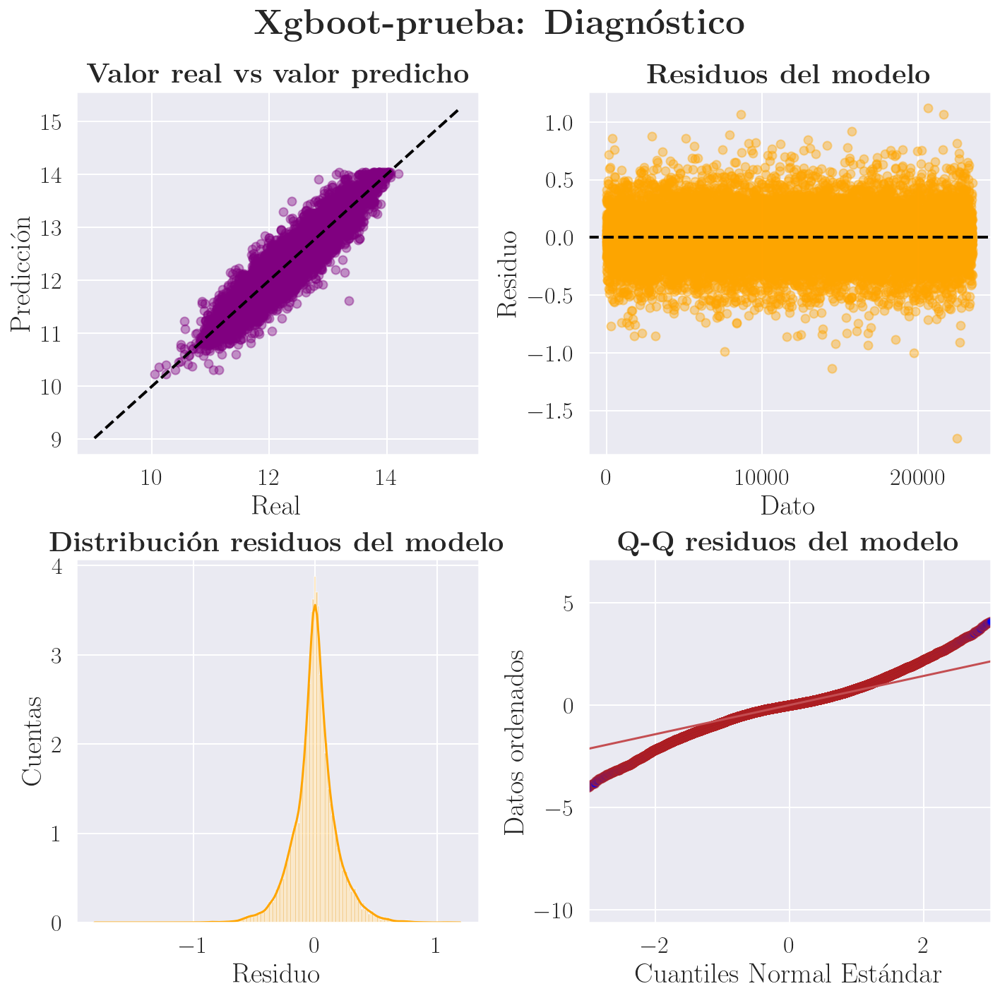

In [148]:
grafica_diagnostico_prueba2(y_test_pred,residuo,rmse_train,rmse_test,r2, r'\textbf{Xgboot-prueba: }')

# Comparación Final modelos

In [150]:
error_modelos = pd.DataFrame({
                        'modelo': ['Benchmark', 'Tree', 'Knn', 'Ridge',
                                   'Lasso','Xgboots','RandomForest','Xgboots-Prueba'],
                        'rmse': [0.236,0.220,0.202,0.235,0.237,0.188,0.176,0.177],
                        'r2': [0.848,0.869,0.889,0.848,0.848,0.904,0.916,0.914]
                     })

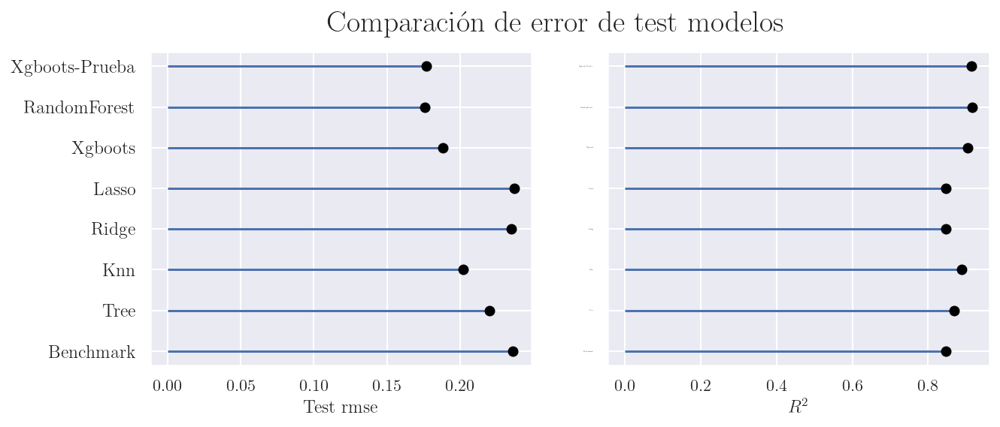

In [151]:
fig = plt.figure(figsize=(10, 3.84)) 
ax1 = plt.subplot(1,2,1) 
ax1.hlines(error_modelos.modelo, xmin=0, xmax=error_modelos.rmse, color ='b')
ax1.plot(error_modelos.rmse, error_modelos.modelo, "o", color='black')
ax1.tick_params(axis='y', which='major', labelsize=12)
ax1.set_xlabel('Test rmse');

ax2 = plt.subplot(1,2,2)
ax2.hlines(error_modelos.modelo, xmin=0, xmax=error_modelos.r2,color='b')
ax2.plot(error_modelos.r2, error_modelos.modelo, "o", color='black')
ax2.tick_params(axis='y', which='major', labelsize=0)
ax2.set_xlabel('$R^2$');
fig.suptitle('Comparación de error de test modelos', fontsize = 20, fontweight = "bold");

Con este procedimiento de deteción de ouliers mejoramos nuestros modelos levemente.